In [1]:
import sys
import os
import warnings
warnings.simplefilter("ignore")
# parentdir = os.path.abspath('../..')
# sys.path.insert(0, parentdir) 
from herculens_import_main import *
import jax
import numpyro
jax.config.update('jax_enable_x64', True)
numpyro.enable_x64()

os.environ['XLA_PYTHON_CLIENT_PREALLOCATE'] = 'false'
os.environ['XLA_FLAGS'] = (
    '--xla_gpu_enable_triton_softmax_fusion=true '
    '--xla_gpu_triton_gemm_any=True '
    '--xla_gpu_enable_async_collectives=true '
    '--xla_gpu_enable_latency_hiding_scheduler=true '
    '--xla_gpu_enable_highest_priority_async_stream=true '
)
if 'graphviz' not in os.environ['PATH']:
    os.environ['PATH'] = '/opt/apps/pkgs/graphviz/12.2.1/intel64/gnu_12.2.0/bin:' + os.environ['PATH']

[CudaDevice(id=0)]


In [2]:
pix_scale = 0.031  # arcsec / pixel (JWST)

DATA_DIR = "../../Data/WFI2033"
raw_data_path = os.path.join(DATA_DIR, "jw01198-o004_t004_nircam_clear-f115w_i2d.fits")
data_path = os.path.join(DATA_DIR, "jw01198-o004_t004_nircam_clear-f115w_i2d_cut_x6985_y3594_150.fits")
mask_path = os.path.join(DATA_DIR, "mask_out_center.fits")
maskout_path = os.path.join(DATA_DIR, "mask_out_center.fits")

with fits.open(raw_data_path, memmap=True) as hdul_raw:
    exposure_time = float(hdul_raw[0].header.get("EXPTIME", hdul_raw[0].header.get("TEXPTIME", 1.0)))

with fits.open(data_path, memmap=True) as hdul:
    data = jnp.array(hdul["SCI"].data) if "SCI" in hdul else jnp.array(hdul[0].data)
    rms_file = jnp.array(hdul["ERR"].data)

mask = jnp.array(fits.getdata(mask_path), dtype=bool)
mask_out = jnp.array(fits.getdata(maskout_path), dtype=bool)
mask = jnp.array(mask_out, dtype=bool)

valid = jnp.isfinite(data) & jnp.isfinite(rms_file) & (rms_file > 0)
mask = mask & valid
npix = int(mask_out.sum())

corner_pixel = 10
bkg_corner = np.array(data[:corner_pixel, :corner_pixel])
bkg_mean = float(np.nanmean(bkg_corner))
bkg_rms = float(np.nanstd(bkg_corner))

data = data - bkg_mean
rms = float(np.nanmedian(np.array(rms_file[mask_out])))

# Assume Step 3 PSF output format is as expected
psf_path_model = os.path.join("./psf_data", "PSF_model_step3_svi.fits")
with fits.open(psf_path_model, memmap=True) as hdul_psf:
    psf_hst = np.array(hdul_psf["DET_PSF_MODEL"].data, dtype=float)

psf_hst = np.clip(psf_hst, 0.0, None)
psf_hst = psf_hst / np.sum(psf_hst)
psf_used = psf_path_model
psf = PSF(psf_type='PIXEL', kernel_point_source=psf_hst)

pixel_grid, xgrid, ygrid, x_axis, y_axis, extent, nx, ny = get_pixel_grid(data, pix_scale)
noise = Noise(nx, ny, exposure_time=exposure_time)
provided_rms = True

N_gauss_light = 2
N_gauss_source = 1

sigma_lims_lens = [0.1, 1.0]
sigma_lims = [0.01, 0.5]
source_grid_scale = 1

conj_points = jnp.array([
    [1.20212170716053, -0.12271885209256231],
    [0.9053233071260114, 0.5277189685977776],
    [-1.0461673774453952, 1.0081083299749878],
    [-0.1255456241215261, -0.8965524340129204],
])

ss_factor = 1

PSF_CORNER_SIZE = 5

def compute_psf_corner_median(psf_kernel, corner_size=PSF_CORNER_SIZE):
    ny, nx = psf_kernel.shape
    cs = min(corner_size, ny, nx)
    corners = np.concatenate([
        psf_kernel[:cs, :cs].reshape(-1),
        psf_kernel[:cs, -cs:].reshape(-1),
        psf_kernel[-cs:, :cs].reshape(-1),
        psf_kernel[-cs:, -cs:].reshape(-1),
    ])
    return float(np.nanmedian(corners))

psf_corner_median = compute_psf_corner_median(psf_hst, corner_size=PSF_CORNER_SIZE)

def subtract_psf_corner_median(model_image, psf_median=psf_corner_median):
    return model_image - jnp.asarray(psf_median, dtype=model_image.dtype)

PSF_CORR_PRIOR = {
    "plate_name": "PSF correction",
    "param_name": "log_psf_corr_center",
    "sigma_log": 1.0,
    "log_clip": 5.0,
}

k_psf = K_grid(psf_hst.shape).k

def build_psf_corr_factor_field(log_psf_corr_center, psf_shape, log_clip=5.0):
    ny, nx = psf_shape
    log_field = jnp.asarray(log_psf_corr_center)
    if log_field.shape != (ny, nx):
        raise ValueError(f'log_psf_corr_center shape {log_field.shape} does not match psf shape {(ny, nx)}')
    return jnp.exp(jnp.clip(log_field, -log_clip, log_clip))

def build_corrected_psf_kernel(psf_base, log_psf_corr_center, eps=1e-12):
    corr_field = build_psf_corr_factor_field(
        log_psf_corr_center,
        jnp.asarray(psf_base).shape,
        log_clip=PSF_CORR_PRIOR["log_clip"],
    )
    psf_eff = jnp.asarray(psf_base) * corr_field
    psf_eff = jnp.maximum(psf_eff, eps)
    psf_eff = psf_eff / (jnp.sum(psf_eff) + eps)
    return psf_eff


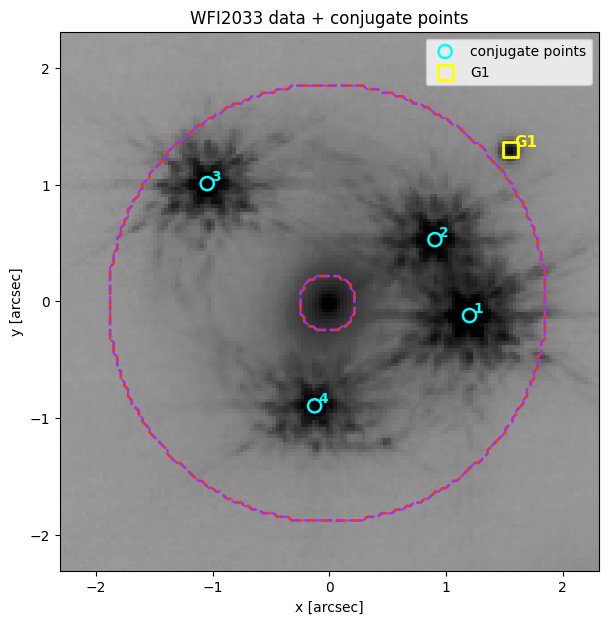

In [3]:
# Quick data visualization (same style as old JWST notebook)
plt.figure(figsize=(8, 7))
plt.imshow(
    np.array(data),
    origin='lower',
    cmap='Grays',
    extent=extent,
    norm=colors.SymLogNorm(linthresh=1, vmax=10.5, vmin=-10),
)
plt.contour(np.array(mask), levels=[0.5], colors='#ff3300', alpha=0.95, linewidths=2, linestyles='dashed', origin='lower', extent=extent)
plt.contour(np.array(mask_out), levels=[0.5], colors='#9933ff', alpha=0.95, linestyles='dashed', origin='lower', extent=extent)

# Overlay conjugate point positions
conj_np = np.array(conj_points, dtype=float)
plt.scatter(
    conj_np[:, 0],
    conj_np[:, 1],
    s=90,
    facecolors='none',
    edgecolors='cyan',
    linewidths=1.8,
    marker='o',
    label='conjugate points',
)
for i, (x, y) in enumerate(conj_np, start=1):
    plt.text(x + 0.03, y + 0.03, str(i), color='cyan', fontsize=10, weight='bold')

# Galaxy labels (for reference)
G1 = (1.556, 1.299)  # first galaxy
G2 = (2.145, -3.326)  # second galaxy

# Show only G1 in this panel
plt.scatter(
    [G1[0]],
    [G1[1]],
    s=120,
    facecolors='none',
    edgecolors='yellow',
    linewidths=2.0,
    marker='s',
    label='G1',
)
plt.text(G1[0] + 0.03, G1[1] + 0.03, 'G1', color='yellow', fontsize=11, weight='bold')

plt.title('WFI2033 data + conjugate points')
plt.xlabel('x [arcsec]')
plt.ylabel('y [arcsec]')
plt.legend(loc='upper right')
plt.show()


In [4]:
# Prior config block
MASS_PRIOR_PARAMETRIC = {
    'gamma_low': 1.95,
    'gamma_up': 2.05,
    'center_high': 0.5,
    'center_low': -0.5,
}

MASS_PRIOR_PIXELATED = {}

LENS_LIGHT_PRIOR_KWARGS = {
    'plate_name': 'Lens light',
    'param_name': 'lens',
    'n_gauss': N_gauss_light,
    'sigma_lims': sigma_lims_lens,
    'e_low': -0.2,
    'e_high': 0.2,
}

POINT_SOURCE_PRIOR = {
    'pos_sigma': 0.05,
    'pos_window': 0.2,
    'log10_amp_low': -3.0,
    'log10_amp_high': 4.5,
    'log10_amp_lens_low': -3.0,
    'log10_amp_lens_high': 4.5,
}

CONJUGATE_POINT_PRIOR = {
    'rate': {
        'parametric': 1000.0,
        'pixelated': 100.0,
    },
}

RMS_PRIOR = {
    'low_factor': 0.5,
    'high_factor': 1.5,
}

SOURCE_GRID_PRIOR = {
    'plate_name': 'Source grid',
    'param_name': 'source_grid',
    'n_high': 1000,
    'positive': True,
}

SIS_G1_PRIOR = {
    'theta_low': 0.0,
    'theta_high': 0.25,
}

G1_MASS_CENTER = (1.556, 1.299)

SIS_G2_PRIOR = {
    'theta_low': 0.5,
    'theta_high': 2.0,
}

G2_MASS_CENTER = (2.145, -3.326)



In [5]:
# Data-loading diagnostics removed by design.


In [6]:
from herculens.PointSourceModel.point_source_model import PointSourceModel

mass_model = MassModel(['EPL', 'SHEAR', 'SIS', 'SIS'])

lens_light_model = LightModel(['MULTI_GAUSSIAN_ELLIPSE'],{})

source_light_model = LightModel(['MULTI_GAUSSIAN_ELLIPSE'],{})

point_source_model = PointSourceModel(
    ['IMAGE_POSITIONS'],
    mass_model=mass_model,
    image_plane=pixel_grid,
)

lens_image = LensImageExtension(
    pixel_grid,
    psf,
    noise_class=noise,
    lens_light_model_class=lens_light_model,
    lens_mass_model_class=mass_model,
    source_model_class=source_light_model,
    point_source_model_class=point_source_model,
    source_arc_mask=mask,
    conjugate_points=conj_points,
    kwargs_numerics={'supersampling_factor': ss_factor},
    source_grid_scale = source_grid_scale
)


In [7]:
npix = int(mask_out.sum())
N_HIGH_SOURCE_GRID = SOURCE_GRID_PRIOR['n_high']

def model(data, k_values=None, conj=True, provided_rms=False, pixelated=False, n_value=None, mass_prior_kwargs={}, psf_kernel=None, k_psf_values=None, enable_psf_corr=False):
    mass_params = EPL_w_shear('Mass model', '1', **mass_prior_kwargs)
    mass_params = mass_params + SIS(
        'Mass model g1',
        'g1',
        origin=G1_MASS_CENTER,
        theta_low=SIS_G1_PRIOR['theta_low'],
        theta_high=SIS_G1_PRIOR['theta_high'],
    )
    mass_params = mass_params + SIS(
        'Mass model g2',
        'g2',
        origin=G2_MASS_CENTER,
        theta_low=SIS_G2_PRIOR['theta_low'],
        theta_high=SIS_G2_PRIOR['theta_high'],
    )
    lens_light = multi_gauss_light(**LENS_LIGHT_PRIOR_KWARGS)

    n_ps = conj_points.shape[0]
    ra_ps = numpyro.sample(
        'ra_ps',
        dist.TruncatedNormal(
            loc=conj_points[:, 0],
            scale=POINT_SOURCE_PRIOR['pos_sigma'],
            low=conj_points[:, 0] - POINT_SOURCE_PRIOR['pos_window'],
            high=conj_points[:, 0] + POINT_SOURCE_PRIOR['pos_window'],
        ),
    )
    dec_ps = numpyro.sample(
        'dec_ps',
        dist.TruncatedNormal(
            loc=conj_points[:, 1],
            scale=POINT_SOURCE_PRIOR['pos_sigma'],
            low=conj_points[:, 1] - POINT_SOURCE_PRIOR['pos_window'],
            high=conj_points[:, 1] + POINT_SOURCE_PRIOR['pos_window'],
        ),
    )
    log10_amp_ps = numpyro.sample(
        'log10_amp_ps',
        dist.Uniform(
            POINT_SOURCE_PRIOR['log10_amp_low'],
            POINT_SOURCE_PRIOR['log10_amp_high'],
        ).expand([n_ps]),
    )

    amp_quasar_ps = jnp.power(10.0, log10_amp_ps)
    kwargs_point_source = [{
        'ra': ra_ps,
        'dec': dec_ps,
        'amp': amp_quasar_ps,
    }]

    lens_img = lens_image_pixel if pixelated else lens_image

    if conj:
        conj_points_model = lens_img.trace_conjugate_points(mass_params)
        conj_distance = reduced_distance_matrix(conj_points_model)
        nc = conj_distance.shape[0]
        rate_key = 'pixelated' if pixelated else 'parametric'
        conj_rate = CONJUGATE_POINT_PRIOR['rate'][rate_key]
        with numpyro.plate(f'Conjugate points 2 - [{nc}]', nc):
            numpyro.sample('conjugate_points', dist.Exponential(conj_rate), obs=conj_distance)

    if pixelated:
        if k_values is None:
            raise ValueError('k_values is required when pixelated=True')
        source_light = [
            matern_power_spectrum(
                SOURCE_GRID_PRIOR['plate_name'],
                SOURCE_GRID_PRIOR['param_name'],
                k_values,
                n_high=SOURCE_GRID_PRIOR['n_high'],
                n_value=n_value,
                positive=SOURCE_GRID_PRIOR['positive'],
            )
        ]
    else:
        conj_points_model_for_center = lens_image.trace_conjugate_points(mass_params)
        source_center = jnp.mean(conj_points_model_for_center, axis=0)
        source_light = multi_gauss_light_center(
            'Source light',
            'source',
            N_gauss_source,
            sigma_lims,
            center_det=source_center,
        )

    psf_ref = jnp.asarray(psf_hst if psf_kernel is None else psf_kernel)
    psf_kernel_eff = psf_kernel
    psf_kernel_det = psf_ref
    corr_field = jnp.ones_like(psf_ref)

    if pixelated and enable_psf_corr:
        corr_shape = tuple(psf_ref.shape)
        log_psf_corr_center = numpyro.sample(
            "log_psf_corr_center",
            dist.Normal(
                0.0,
                PSF_CORR_PRIOR["sigma_log"],
            ).expand(corr_shape),
        )
        corr_field = build_psf_corr_factor_field(
            log_psf_corr_center,
            psf_ref.shape,
            log_clip=PSF_CORR_PRIOR["log_clip"],
        )
        psf_kernel_det = build_corrected_psf_kernel(
            psf_ref,
            log_psf_corr_center,
        )
        psf_kernel_eff = psf_kernel_det

    numpyro.deterministic('psf_corr_factor_field', corr_field)
    numpyro.deterministic('psf_kernel_corrected', psf_kernel_det)

    model_image = lens_img.model(
        kwargs_lens=mass_params,
        kwargs_source=source_light,
        kwargs_lens_light=lens_light,
        kwargs_point_source=kwargs_point_source,
        source_add=True,
        point_source_add=True,
        psf_kernel=psf_kernel_eff,
    )

    if provided_rms:
        model_std = rms_file
    else:
        background_rms_model = numpyro.sample(
            'RMS',
            dist.LogUniform(rms * RMS_PRIOR['low_factor'], rms * RMS_PRIOR['high_factor']),
        )
        model_var = lens_img.Noise.C_D_model(model_image, background_rms=background_rms_model)
        model_std = jnp.sqrt(model_var)

    model_image_masked_out = model_image[mask_out]
    model_std_masked_out = model_std[mask_out]

    numpyro.deterministic('model_image', model_image)

    with numpyro.plate(f'Data masked - [{npix}]', npix):
        numpyro.sample('obs', dist.Normal(model_image_masked_out, model_std_masked_out), obs=data[mask_out])

def params2kwargs(params, fixed_params={}, pixelated=False):
    params_full = params | fixed_params
    kwargs_lens = params2kwargs_EPL_w_shear(params_full, '1') + params2kwargs_SIS(params_full, 'g1') + params2kwargs_SIS(params_full, 'g2')
    kwargs_lens_light = params2kwargs_multi_gauss_light(params_full, 'lens')
    kwargs_point_source = [{
        'ra': params_full['ra_ps'],
        'dec': params_full['dec_ps'],
        'amp': jnp.power(10.0, params_full['log10_amp_ps']),
    }]

    if pixelated:
        kwargs_source = [params2kwargs_power_spectrum(params_full, 'source_grid')]
    else:
        conj_points_model = lens_image.trace_conjugate_points(kwargs_lens)
        source_center = jnp.mean(conj_points_model, axis=0)
        n_source = params_full['amp_source'].shape[0]
        center_source = jnp.vstack([
            jnp.full((n_source,), source_center[0]),
            jnp.full((n_source,), source_center[1]),
        ])
        params_full = params_full | {'center_source': center_source}
        kwargs_source = params2kwargs_multi_gauss_light(params_full, 'source')

    return {
        'kwargs_lens': kwargs_lens,
        'kwargs_source': kwargs_source,
        'kwargs_lens_light': kwargs_lens_light,
        'kwargs_point_source': kwargs_point_source,
    }

def params2psf_kernel(params):
    log_psf_corr_center = params['log_psf_corr_center']
    return build_corrected_psf_kernel(psf_hst, log_psf_corr_center)

model_graph = numpyro.render_model(
    model,
    model_args=(data,),
    model_kwargs={
        'pixelated': False,
        'provided_rms': provided_rms,
        'mass_prior_kwargs': MASS_PRIOR_PARAMETRIC,
    },
    render_distributions=True,
)



100%|██████████| 10000/10000 [00:34<00:00, 288.60it/s, init loss: 5332263.5037, avg. loss [9501-10000]: 96777.8632]


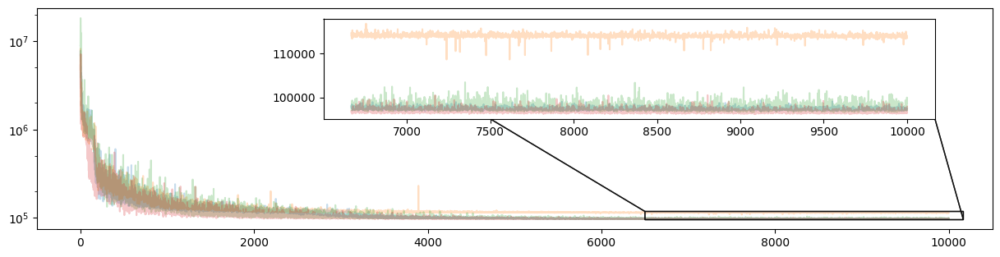

In [8]:
max_iterations = 10000
num_chains = 4

amp_ps_start = jnp.array([10120.25246224, 5648.26269992, 5112.50014416, 3735.28867656], dtype=jnp.float64)
init_values_parametric = {
    'log10_amp_ps': jnp.log10(amp_ps_start),
}
init_fun = init_to_value_or_defer(values=init_values_parametric)
scheduler = split_scheduler(max_iterations, init_value=0.01, transition_steps=[200, 10])
optim = optax.adabelief(learning_rate=scheduler)
loss = infer.Trace_ELBO(num_particles=1)

rng_key = jax.random.PRNGKey(420)
rng_key, rng_key_ = jax.random.split(rng_key)
svi_keys = jax.random.split(rng_key_, num_chains)

param_results_list = []
param_guides = []
for i in range(num_chains):
    guide_i = autoguide.AutoLowRankMultivariateNormal(model, init_loc_fn=init_fun)
    svi_i = infer.SVI(model, guide_i, optim, loss)
    result_i = svi_i.run(
        svi_keys[i],
        max_iterations,
        data,
        provided_rms=provided_rms,
        mass_prior_kwargs=MASS_PRIOR_PARAMETRIC,
        progress_bar=True,
        stable_update=True,
    )
    param_guides.append(guide_i)
    param_results_list.append(result_i)


def _stack_or_none(*xs):
    first = xs[0]
    return None if first is None else jnp.stack(xs)


multi_svi_results = jax.tree.map(_stack_or_none, *param_results_list)
guide = param_guides[0]
multi_svi_median = guide.median(multi_svi_results.params)

multi_svi_median_herc = median_params2kwargs(params2kwargs, multi_svi_median, jnp.arange(num_chains))

_, ax = plt.subplots(figsize=(15, 3.5))
axins = ax.inset_axes([0.3, 0.5, 0.64, 0.45])

for losses in multi_svi_results.losses:
    _ = plot_loss(losses, max_iterations, ax=ax, axins=axins, alpha=0.25)


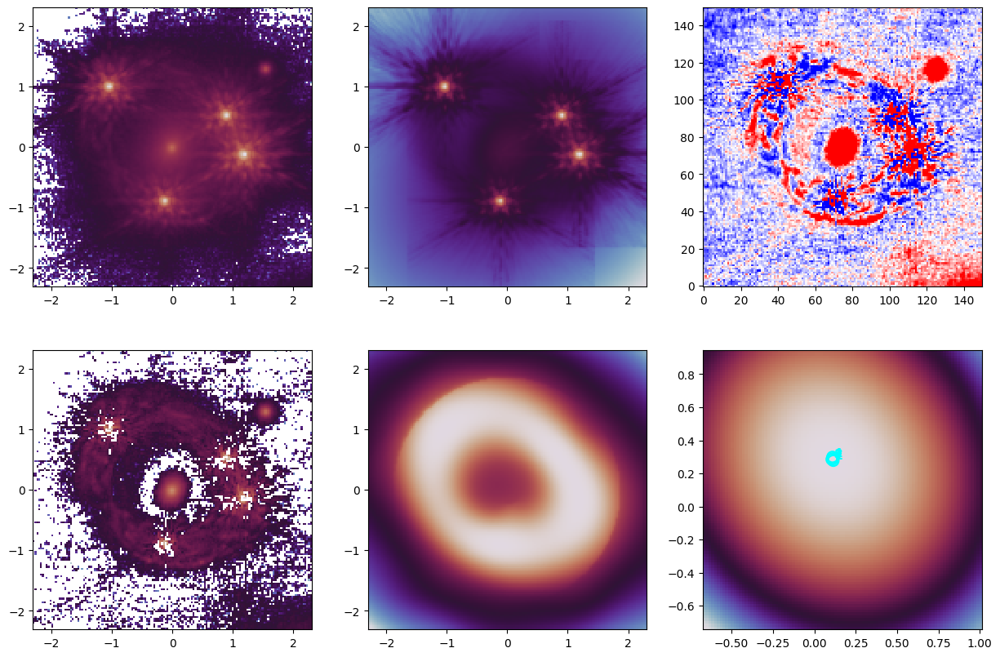

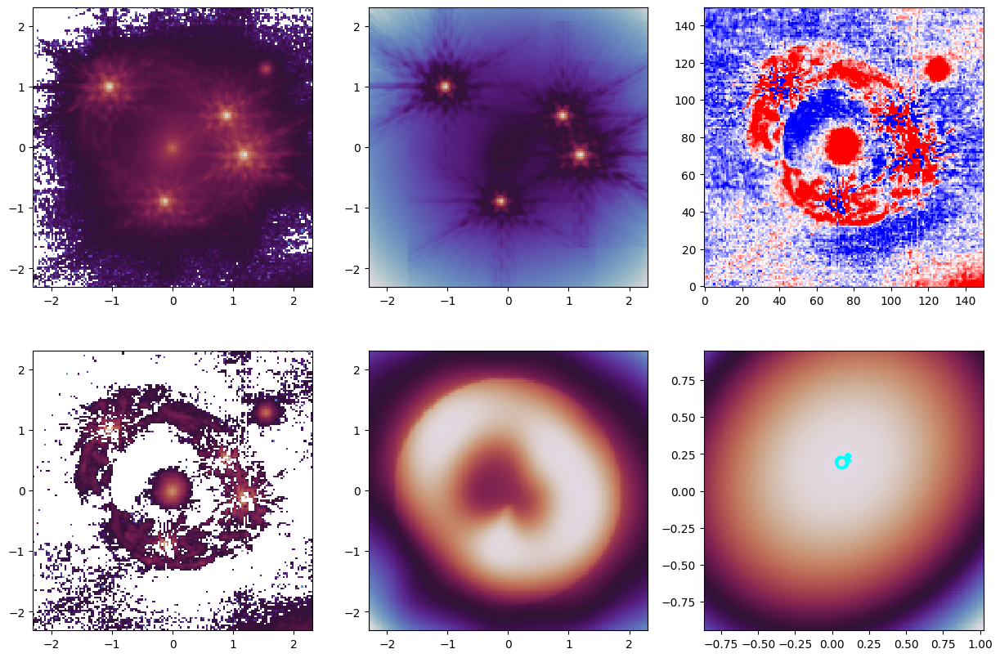

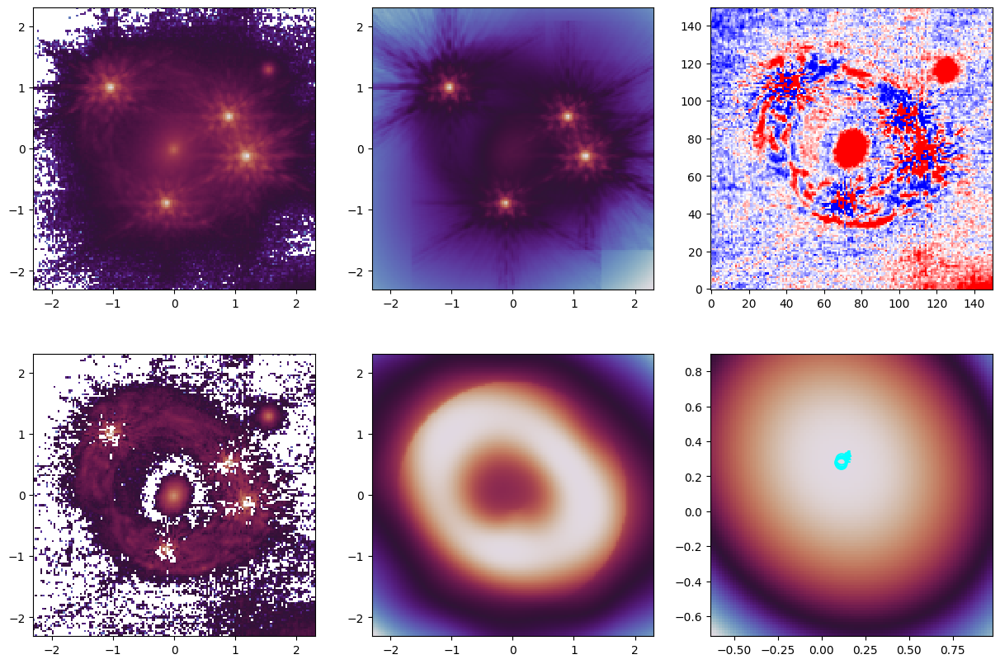

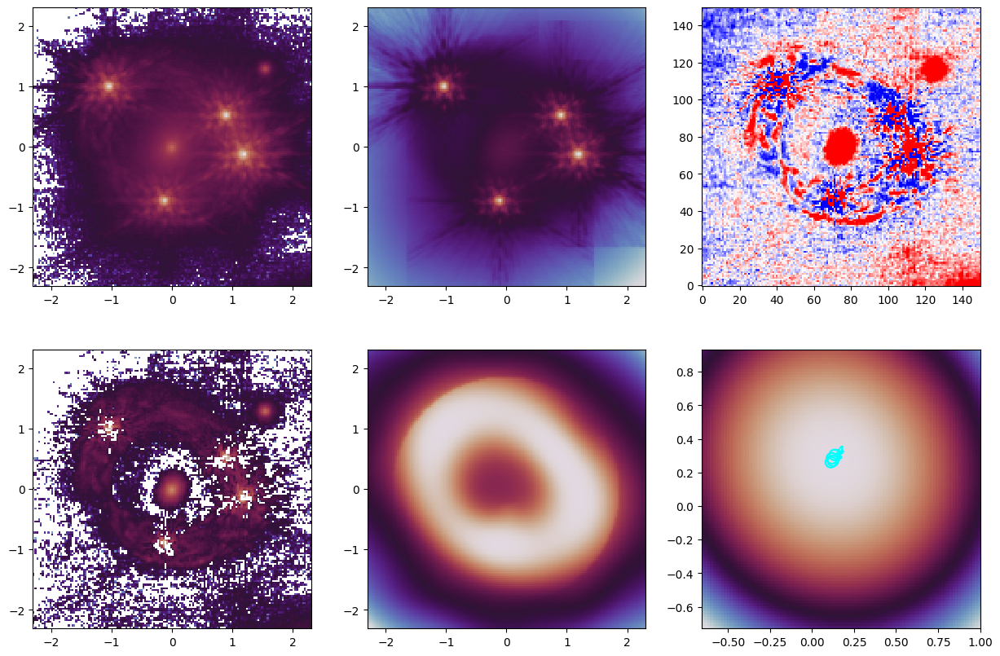

In [9]:
from lens_images_extension import pixelize_plane as pixelize_plane_single

for i in range(4):
    kwargs_i = get_value_from_index(multi_svi_median_herc, i)

    plt.figure(figsize=(15, 10))
    plt.subplot(2, 3, 1)
    plt.imshow(data, norm='log', cmap='twilight', extent=extent, origin='lower')

    plt.subplot(2, 3, 2)
    image_model = lens_image.model(**kwargs_i, source_add=True)
    plt.imshow(image_model, norm='log', cmap='twilight', extent=extent)

    plt.subplot(2, 3, 3)
    plt.imshow((data - image_model) / rms_file, cmap='bwr', vmax=3, vmin=-3)

    plt.subplot(2, 3, 4)
    lens_light = lens_image.model(**kwargs_i, source_add=False)
    plt.imshow(data - lens_light, norm='log', cmap='twilight', extent=extent)

    plt.subplot(2, 3, 5)
    plt.imshow(image_model - lens_light, norm='log', cmap='twilight', extent=extent)

    plt.subplot(2, 3, 6)
    source, source_extent = pixelize_plane_single(
        lens_image,
        kwargs_i,
        100,
    )
    plt.imshow(source, extent=source_extent, norm='log', cmap='twilight')
    src_x, src_y = trace_current_agn_to_source(lens_image, kwargs_i)
    plt.scatter(np.array(src_x), np.array(src_y), s=90, facecolors='none', edgecolors='cyan', linewidths=1.6, marker='o')
    for j, (sx, sy) in enumerate(zip(np.array(src_x), np.array(src_y)), start=1):
        plt.text(sx + 0.01, sy + 0.01, str(j), color='cyan', fontsize=10, weight='bold')


In [10]:
best_pix_sizes = np.array([
    get_best_pixel_size(
        lens_image,
        get_value_from_index(multi_svi_median_herc, i),
        source_grid_scale
    ) for i in range(num_chains)
])
pixel_grid_shape = np.median(best_pix_sizes).astype(int)*1
# pixel_grid_shape = 50
print(pixel_grid_shape)

45


In [11]:
vars_mass = ['theta_E_1', 'theta_E_g1', 'theta_E_g2', 'gamma_1', 'e_1', 'center_1', 'gamma_sheer_1']
vars_lens_light = ['A_lens', 'sigma_lens', 'e_lens', 'center_lens']
vars_source_light = ['A_source', 'sigma_source', 'e_source']
vars_point_source = ['ra_ps', 'dec_ps', 'log10_amp_ps']
vars_other = []

svi_samples = guide.sample_posterior(rng_key_, multi_svi_results.params, sample_shape=(1000,))
svi_samples_chains = jax.tree.map(lambda x: jnp.swapaxes(x, 0, 1), svi_samples)
svi_samples_chains = jax.device_get(svi_samples_chains)
multi_svi_guide_sample = az.from_dict(svi_samples_chains)

k_grid = K_grid((pixel_grid_shape, pixel_grid_shape))

orig_source_list = []
for idx in range(num_chains):
    image_i, _ = pixelize_plane_single(
        lens_image,
        get_value_from_index(multi_svi_median_herc, idx),
        pixel_grid_shape,
        source_grid_scale=source_grid_scale,
    )
    orig_source_list.append(image_i)
orig_source = jnp.stack(orig_source_list, axis=0)
ps_keys = jax.random.split(rng_key_, num_chains)
from herculens_import_main import source_power_spectrum
ps_fits = source_power_spectrum(orig_source, ps_keys, None, True)

keys_for_pixel_init = vars_lens_light + vars_mass + vars_point_source + vars_other
multi_svi_median_pixelated = {k: multi_svi_median[k] for k in keys_for_pixel_init if k in multi_svi_median} | ps_fits




In [12]:
k_grid = K_grid((pixel_grid_shape, pixel_grid_shape))

from herculens.PointSourceModel.point_source_model import PointSourceModel

mass_model_pixel = MassModel(['EPL', 'SHEAR', 'SIS', 'SIS'])
lens_light_model_pixel = LightModel(['MULTI_GAUSSIAN_ELLIPSE'],{})

source_light_model_pixel = LightModel(
    ['PIXELATED',],
    pixel_adaptive_grid=True,
    pixel_interpol='fast_bilinear',
    kwargs_pixelated={'num_pixels': pixel_grid_shape}
)

pixel_grid_pixel = deepcopy(pixel_grid)
psf_pixel = deepcopy(psf)

point_source_model_pixel = PointSourceModel(
    ['IMAGE_POSITIONS'],
    mass_model=mass_model_pixel,
    image_plane=pixel_grid_pixel,
)

lens_image_pixel = LensImageExtension(
    pixel_grid_pixel,
    psf_pixel,
    noise_class=noise,
    lens_light_model_class=lens_light_model_pixel,
    lens_mass_model_class=mass_model_pixel,
    source_model_class=source_light_model_pixel,
    point_source_model_class=point_source_model_pixel,
    source_arc_mask=mask,
    conjugate_points=conj_points,
    kwargs_numerics={'supersampling_factor': ss_factor},
    source_grid_scale=source_grid_scale,
)



In [13]:
npix = int(mask_out.sum())
N_HIGH_SOURCE_GRID = 1000

model_graph = numpyro.render_model(
    model,
    model_args=(data, k_grid.k),
    model_kwargs={'conj': False, 'pixelated': True, 'provided_rms': provided_rms, 'mass_prior_kwargs': MASS_PRIOR_PIXELATED},
    render_distributions=True,
)


100%|██████████| 10000/10000 [00:30<00:00, 324.42it/s, init loss: 108270.1715, avg. loss [9501-10000]: 79320.3552]


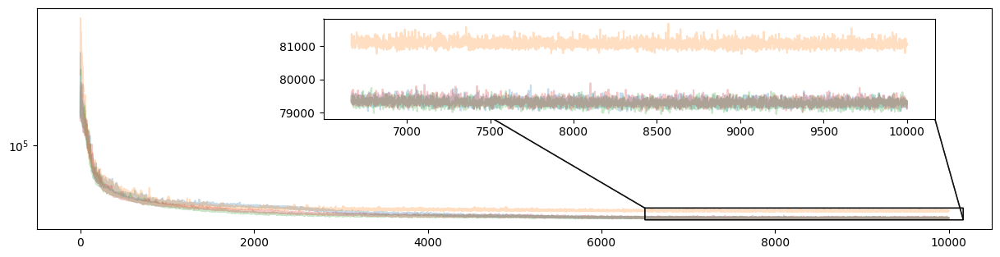

In [14]:
max_iterations = 10000
num_chains = 4

scheduler_stage1 = split_scheduler(max_iterations, init_value=0.01, transition_steps=[200, 10])
optim_stage1 = optax.adabelief(learning_rate=scheduler_stage1)
loss_stage1 = infer.TraceMeanField_ELBO()

svi_keys = jax.random.split(rng_key_, num_chains)
stage1_results_list = []
stage1_guides = []

for i in range(num_chains):
    init_fun_stage1_i = init_to_value_or_defer(values=get_value_from_index(multi_svi_median_pixelated, i))
    guide_stage1_i = autoguide.AutoDiagonalNormal(model, init_loc_fn=init_fun_stage1_i, init_scale=0.01)
    svi_stage1_i = infer.SVI(model, guide_stage1_i, optim_stage1, loss_stage1)
    result_i = svi_stage1_i.run(
        svi_keys[i],
        max_iterations,
        data,
        k_grid.k,
        conj=True,
        n_value=None,
        pixelated=True,
        provided_rms=provided_rms,
        mass_prior_kwargs=MASS_PRIOR_PIXELATED,
        progress_bar=True,
        stable_update=True,
        enable_psf_corr=False,
    )
    stage1_guides.append(guide_stage1_i)
    stage1_results_list.append(result_i)

def _stack_or_none(*xs):
    if xs[0] is None:
        return None
    return jnp.stack(xs)

multi_svi_pixel_results_stage1 = jax.tree.map(_stack_or_none, *stage1_results_list)
guide_pixel_stage1 = stage1_guides[0]
multi_svi_pixel_median_stage1 = guide_pixel_stage1.median(multi_svi_pixel_results_stage1.params)
multi_svi_pixel_median_herc_stage1 = median_params2kwargs(
    lambda p, fixed_params={}: params2kwargs(p, fixed_params=fixed_params, pixelated=True),
    multi_svi_pixel_median_stage1,
    jnp.arange(num_chains),
)

_, ax = plt.subplots(figsize=(15, 3.5))
axins = ax.inset_axes([0.3, 0.5, 0.64, 0.45])

for losses in multi_svi_pixel_results_stage1.losses:
    _ = plot_loss(losses, max_iterations, ax=ax, axins=axins, alpha=0.25)

#383 source pixels: 6120s

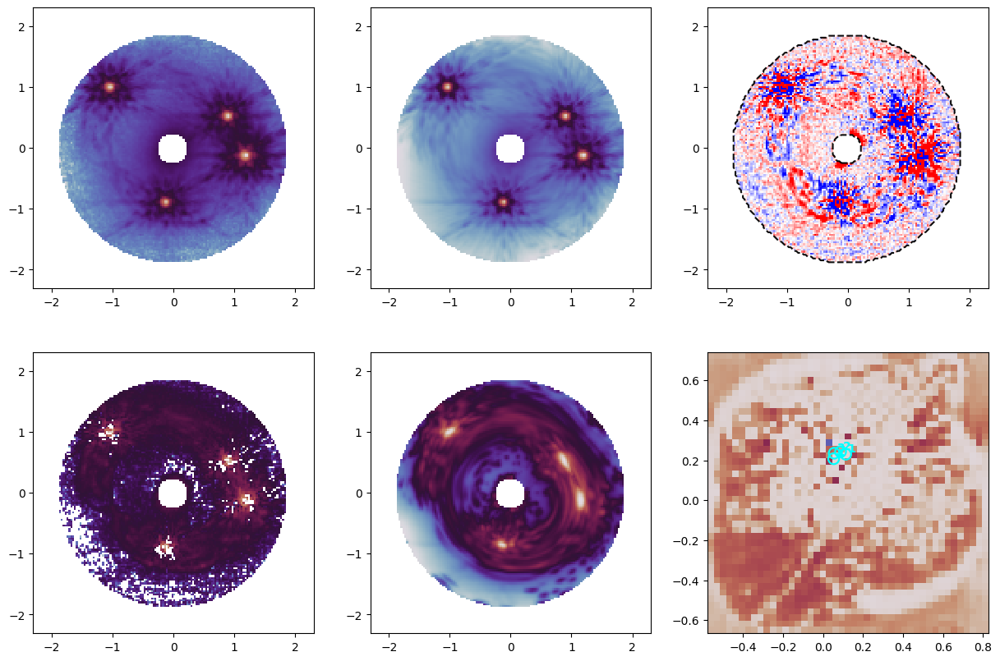

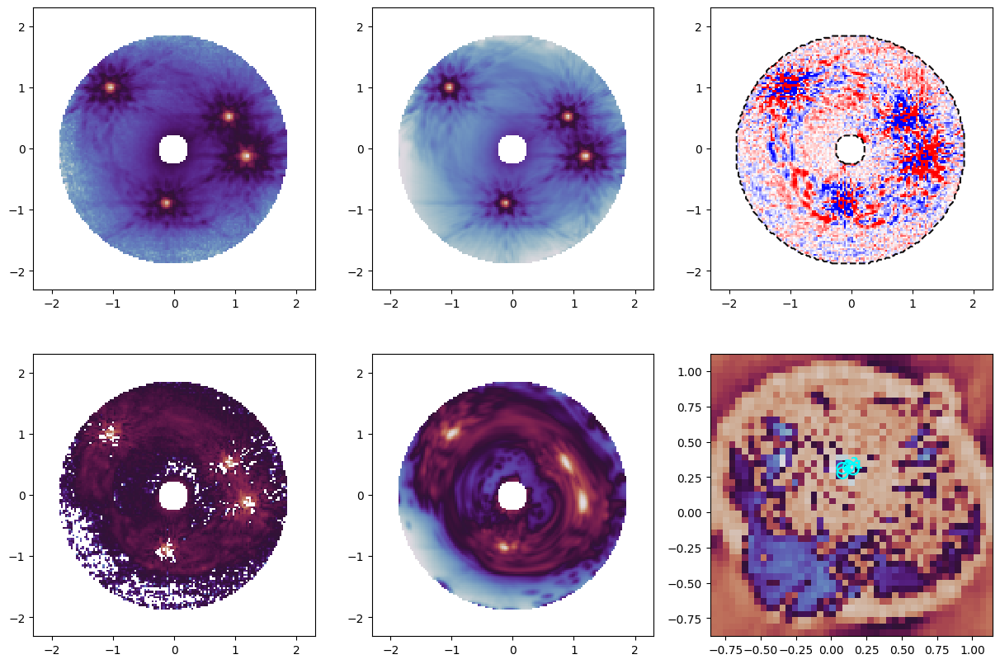

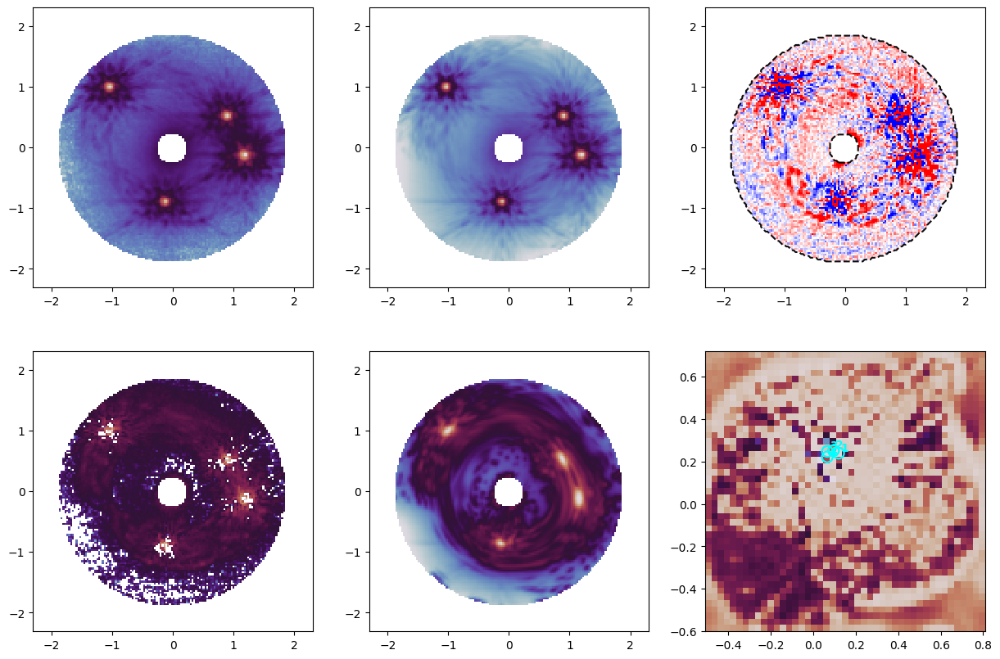

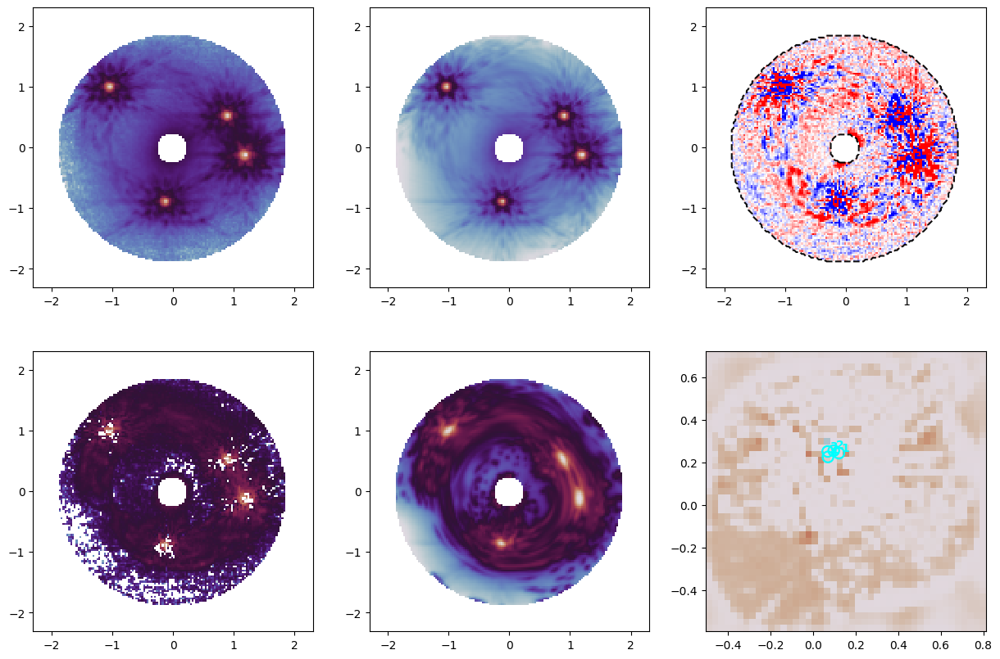

In [15]:
from lens_images_extension import pixelize_plane as pixelize_plane_single

for i in range(4):
    kwargs_i = get_value_from_index(multi_svi_pixel_median_herc_stage1, i)

    plt.figure(figsize=(15, 10))
    plt.subplot(2, 3, 1)
    plt.imshow(np.ma.array(data, mask=~mask_out), norm='log', cmap='twilight', extent=extent, origin='lower')

    plt.subplot(2, 3, 2)
    image_model = lens_image_pixel.model(**kwargs_i, source_add=True)
    plt.imshow(np.ma.array(image_model, mask=~mask_out), norm='log', cmap='twilight', extent=extent)

    plt.subplot(2, 3, 3)
    plt.imshow(np.ma.array((data - image_model) / rms_file, mask=~mask_out), cmap='bwr', vmax=3, vmin=-3, extent=extent)
    plt.contour(mask, levels=[0.5], colors='black', alpha=0.95, linewidth=2, linestyles='dashed', origin='lower', extent=extent)

    plt.subplot(2, 3, 4)
    lens_light = lens_image_pixel.model(**kwargs_i, source_add=False)
    plt.imshow(np.ma.array(data - lens_light, mask=~mask_out), norm='log', cmap='twilight', extent=extent)

    plt.subplot(2, 3, 5)
    plt.imshow(np.ma.array(image_model - lens_light, mask=~mask_out), norm='log', cmap='twilight', extent=extent)

    plt.subplot(2, 3, 6)
    source, source_extent = pixelize_plane_single(
        lens_image_pixel,
        kwargs_i,
        pixel_grid_shape,
    )
    plt.imshow(source, extent=source_extent, norm='log', cmap='twilight')
    src_x, src_y = trace_current_agn_to_source(lens_image_pixel, kwargs_i)
    plt.scatter(np.array(src_x), np.array(src_y), s=90, facecolors='none', edgecolors='cyan', linewidths=1.6, marker='o')
    for j, (sx, sy) in enumerate(zip(np.array(src_x), np.array(src_y)), start=1):
        plt.text(sx + 0.01, sy + 0.01, str(j), color='cyan', fontsize=10, weight='bold')


100%|██████████| 20000/20000 [00:56<00:00, 356.02it/s, init loss: 131283.1740, avg. loss [19001-20000]: 20067.5120]


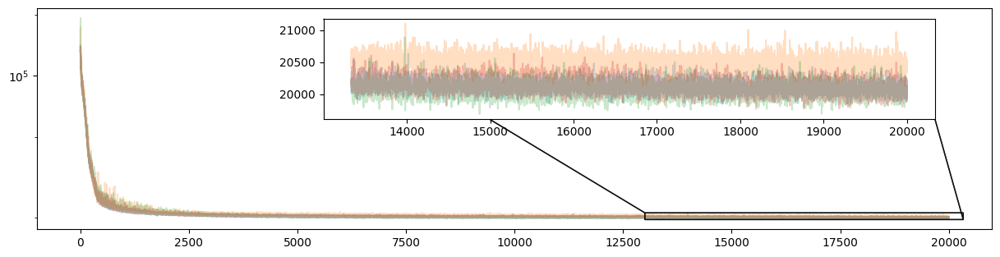

In [16]:
max_iterations = 20000
num_chains = 4

scheduler_stage2 = optax.exponential_decay(
    init_value=5e-3,
    transition_steps=200,
    decay_rate=0.99,
)
optim_stage2 = optax.adabelief(learning_rate=scheduler_stage2)
loss_stage2 = infer.TraceMeanField_ELBO()

svi_keys = jax.random.split(rng_key_, num_chains)
stage2_results_list = []
stage2_guides = []

for i in range(num_chains):
    init_values_stage2_i = get_value_from_index(multi_svi_pixel_median_stage1, i) | {
        'log_psf_corr_center': jnp.zeros(psf_hst.shape),
    }
    init_fun_stage2_i = init_to_value_or_defer(values=init_values_stage2_i)
    guide_stage2_i = autoguide.AutoDiagonalNormal(model, init_loc_fn=init_fun_stage2_i, init_scale=0.01)
    svi_stage2_i = infer.SVI(model, guide_stage2_i, optim_stage2, loss_stage2)
    result_i = svi_stage2_i.run(
        svi_keys[i],
        max_iterations,
        data,
        k_grid.k,
        conj=True,
        n_value=None,
        pixelated=True,
        provided_rms=provided_rms,
        mass_prior_kwargs=MASS_PRIOR_PIXELATED,
        psf_kernel=psf_hst,
        k_psf_values=k_psf,
        enable_psf_corr=True,
        progress_bar=True,
        stable_update=True,
    )
    stage2_guides.append(guide_stage2_i)
    stage2_results_list.append(result_i)

def _stack_or_none(*xs):
    if xs[0] is None:
        return None
    return jnp.stack(xs)

multi_svi_pixel_results_stage2 = jax.tree.map(_stack_or_none, *stage2_results_list)
guide_pixel_stage2 = stage2_guides[0]
multi_svi_pixel_median_stage2 = guide_pixel_stage2.median(multi_svi_pixel_results_stage2.params)
multi_svi_pixel_median_herc_stage2 = median_params2kwargs(
    lambda p, fixed_params={}: params2kwargs(p, fixed_params=fixed_params, pixelated=True),
    multi_svi_pixel_median_stage2,
    jnp.arange(num_chains),
)

_, ax = plt.subplots(figsize=(15, 3.5))
axins = ax.inset_axes([0.3, 0.5, 0.64, 0.45])

for losses in multi_svi_pixel_results_stage2.losses:
    _ = plot_loss(losses, max_iterations, ax=ax, axins=axins, alpha=0.25)

In [17]:
# Stage2b removed for now.
# Stage2 outputs are used directly in downstream blocks.


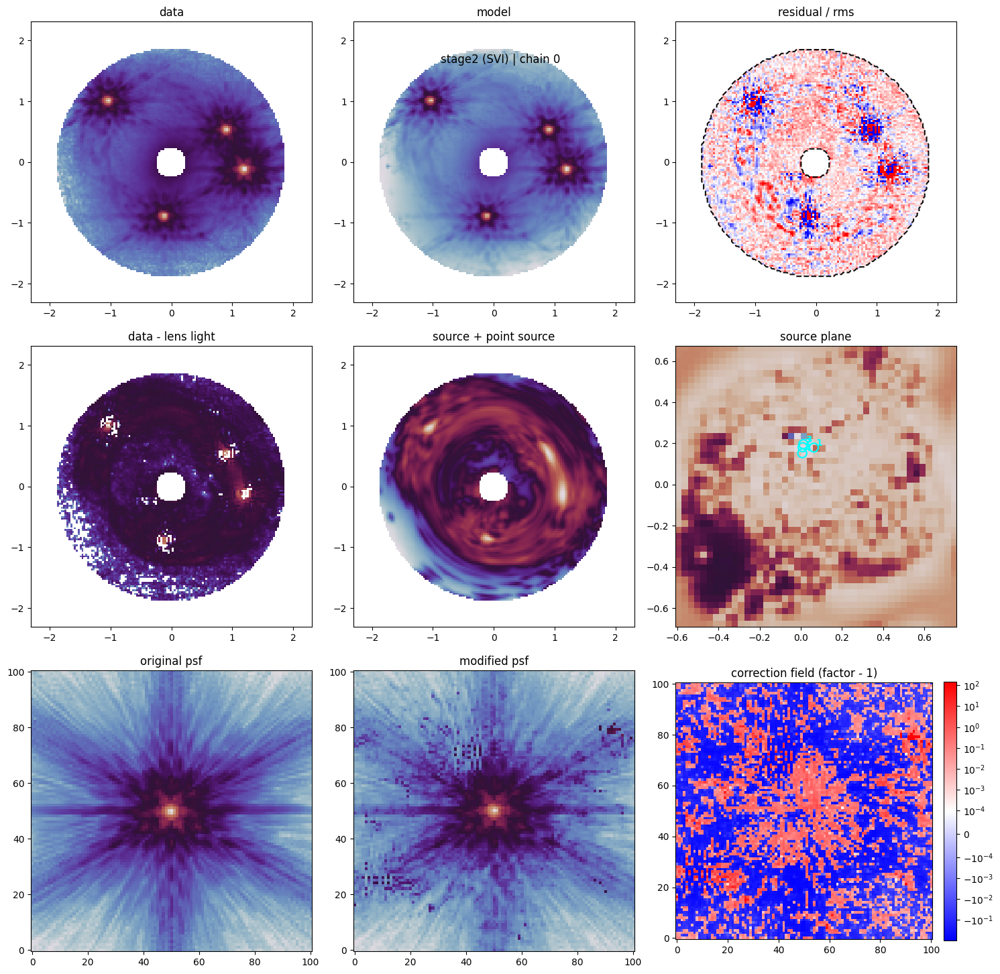

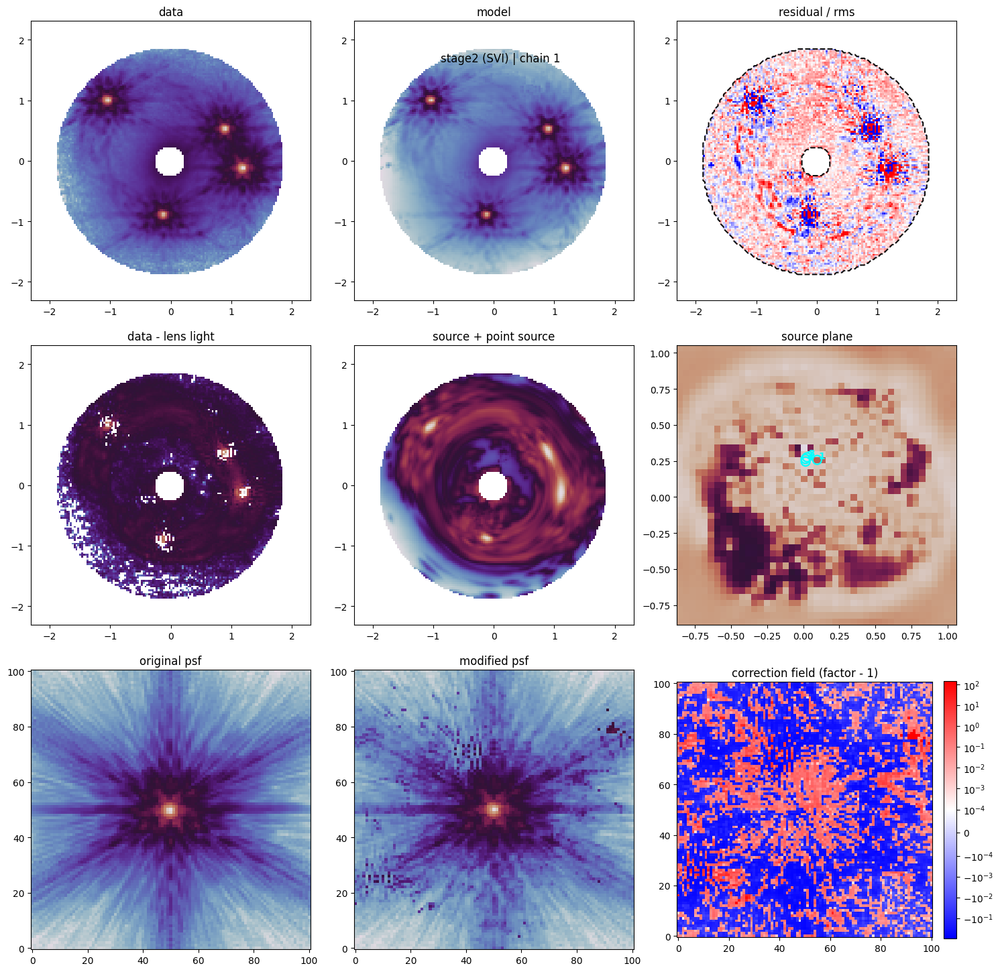

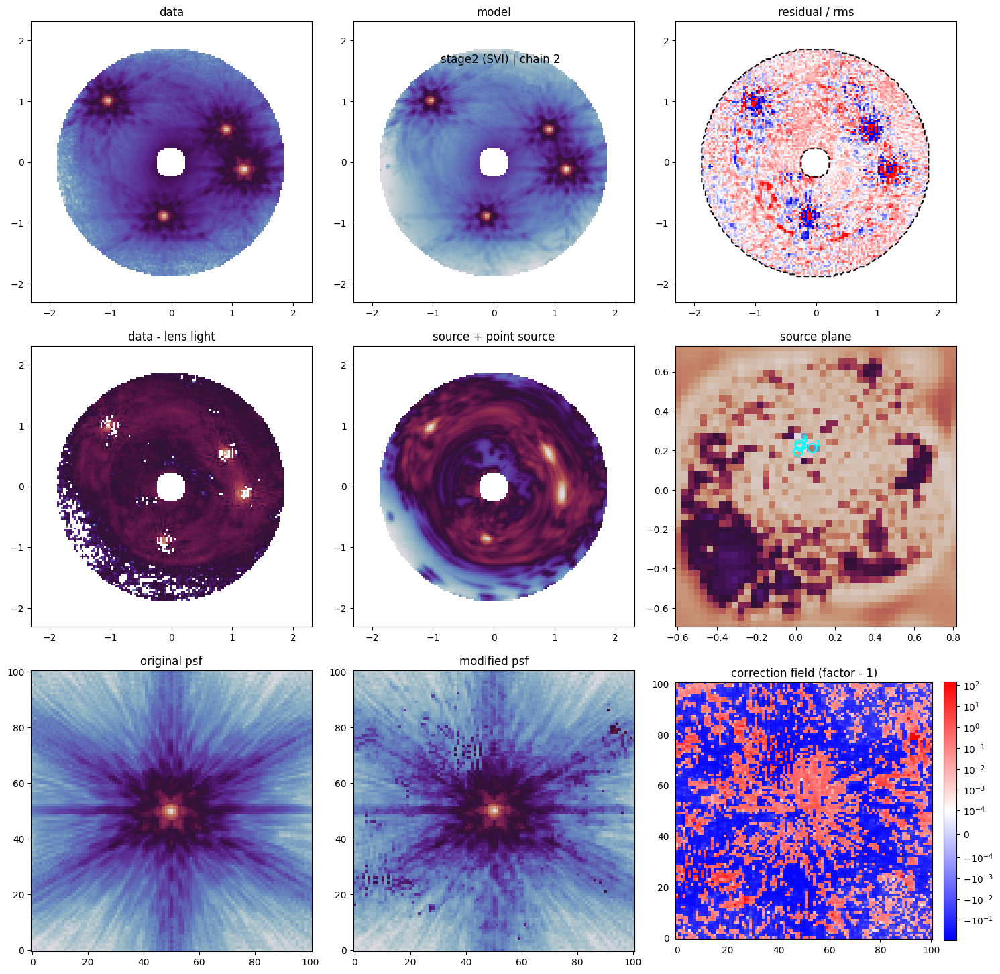

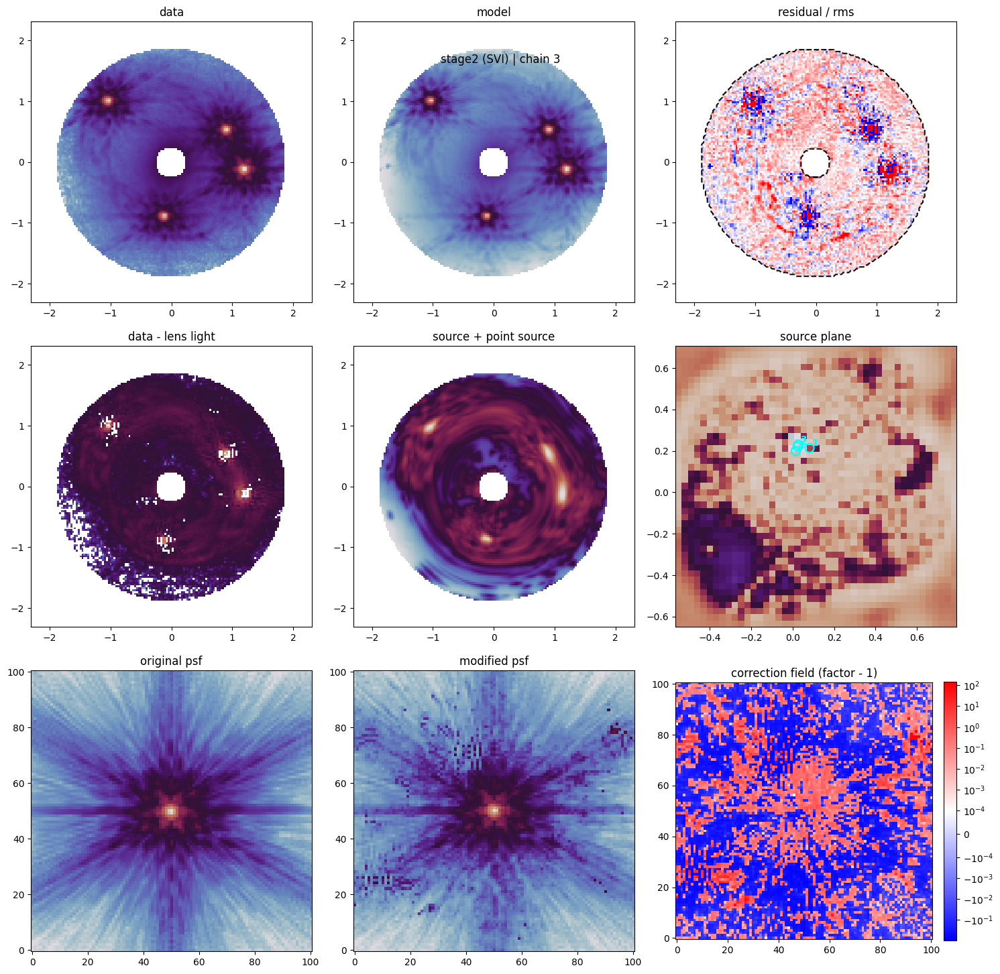

In [18]:
from lens_images_extension import pixelize_plane as pixelize_plane_single

def get_stage2_deterministics_from_median(params_all):
    psf_kernel_all = []
    corr_field_all = []
    for i in range(num_chains):
        params_i = get_value_from_index(params_all, i)
        trace_i = numpyro.handlers.trace(
            numpyro.handlers.substitute(
                numpyro.handlers.seed(model, jax.random.PRNGKey(1000 + i)),
                data=params_i,
            )
        ).get_trace(
            data,
            k_grid.k,
            conj=True,
            n_value=None,
            pixelated=True,
            provided_rms=provided_rms,
            mass_prior_kwargs=MASS_PRIOR_PIXELATED,
            psf_kernel=psf_hst,
            k_psf_values=k_psf,
            enable_psf_corr=True,
        )
        psf_kernel_all.append(trace_i['psf_kernel_corrected']['value'])
        corr_field_all.append(trace_i['psf_corr_factor_field']['value'])
    return jnp.stack(psf_kernel_all), jnp.stack(corr_field_all)

def plot_stage2_result_set(kwargs_all, psf_kernel_all, corr_field_all, stage_label):
    for i in range(num_chains):
        kwargs_i = get_value_from_index(kwargs_all, i)
        psf_kernel_i = get_value_from_index(psf_kernel_all, i)
        corr_field_i = get_value_from_index(corr_field_all, i)

        plt.figure(figsize=(15, 15))
        plt.suptitle(f'{stage_label} | chain {i}', y=0.92)

        plt.subplot(3, 3, 1)
        plt.imshow(np.ma.array(data, mask=~mask_out), norm='log', cmap='twilight', extent=extent, origin='lower')
        plt.title('data')

        plt.subplot(3, 3, 2)
        image_model = lens_image_pixel.model(
            **kwargs_i,
            source_add=True,
            point_source_add=True,
            psf_kernel=psf_kernel_i,
        )
        plt.imshow(np.ma.array(image_model, mask=~mask_out), norm='log', cmap='twilight', extent=extent)
        plt.title('model')

        plt.subplot(3, 3, 3)
        plt.imshow(np.ma.array((data - image_model) / rms_file, mask=~mask_out), cmap='bwr', vmax=3, vmin=-3, extent=extent)
        plt.contour(mask, levels=[0.5], colors='black', alpha=0.95, linewidth=2, linestyles='dashed', origin='lower', extent=extent)
        plt.title('residual / rms')

        lens_light_only = lens_image_pixel.model(
            **kwargs_i,
            source_add=False,
            point_source_add=True,
            psf_kernel=psf_kernel_i,
        )

        plt.subplot(3, 3, 4)
        plt.imshow(np.ma.array(data - lens_light_only, mask=~mask_out), norm='log', cmap='twilight', extent=extent)
        plt.title('data - lens light')

        plt.subplot(3, 3, 5)
        plt.imshow(np.ma.array(image_model - lens_light_only, mask=~mask_out), norm='log', cmap='twilight', extent=extent)
        plt.title('source + point source')

        plt.subplot(3, 3, 6)
        source, source_extent = pixelize_plane_single(
            lens_image_pixel,
            kwargs_i,
            pixel_grid_shape,
        )
        plt.imshow(source, extent=source_extent, norm='log', cmap='twilight')
        src_x, src_y = trace_current_agn_to_source(lens_image_pixel, kwargs_i)
        plt.scatter(np.array(src_x), np.array(src_y), s=90, facecolors='none', edgecolors='cyan', linewidths=1.6, marker='o')
        for j, (sx, sy) in enumerate(zip(np.array(src_x), np.array(src_y)), start=1):
            plt.text(sx + 0.01, sy + 0.01, str(j), color='cyan', fontsize=10, weight='bold')
        plt.title('source plane')

        plt.subplot(3, 3, 7)
        plt.imshow(psf_hst, origin='lower', norm='log', cmap='twilight')
        plt.title('original psf')

        plt.subplot(3, 3, 8)
        plt.imshow(psf_kernel_i, origin='lower', norm='log', cmap='twilight')
        plt.title('modified psf')

        plt.subplot(3, 3, 9)
        plt.imshow(corr_field_i - 1.0, origin='lower', cmap='bwr', norm=colors.SymLogNorm(linthresh=1e-4))
        plt.colorbar(fraction=0.046, pad=0.04)
        plt.title('correction field (factor - 1)')

        plt.tight_layout()
        plt.show()

# Stage2 (SVI) result
stage2_psf_kernel_det, stage2_corr_field_det = get_stage2_deterministics_from_median(multi_svi_pixel_median_stage2)
plot_stage2_result_set(
    multi_svi_pixel_median_herc_stage2,
    stage2_psf_kernel_det,
    stage2_corr_field_det,
    'stage2 (SVI)',
)



In [19]:
# Build a new RMS map after stage2 using:
#   1) stage2 best-SVI point-source centers/flux,
#   2) stage2 best corrected PSF kernel, and
#   3) alpha_map (fractional PSF-shape extra-noise template from Step3).
#
# Formula implemented in psf_extra_error.py:
#   sigma_total^2 = sigma_det^2 + sum_i (alpha_i * psf_model_i)^2
# where psf_model_i is rendered by Herculens for AGN-i.

from psf_extra_error import (
    extract_stage2_arcsec_and_flux,
    build_error_map_with_psf_extra,
)

# Select the best stage2 chain using the final SVI loss.
stage2_losses_np = np.array(jax.device_get(multi_svi_pixel_results_stage2.losses), dtype=float)
best_stage2_i = int(np.argmin(stage2_losses_np[:, -1]))

# Read best-chain stage2 median parameters.
params_stage2_best = get_value_from_index(multi_svi_pixel_median_stage2, best_stage2_i)

# Extract AGN arcsec centers and linear AGN flux from stage2 params.
agn_positions_arcsec, agn_flux = extract_stage2_arcsec_and_flux(
    stage2_params=params_stage2_best,
)

# Read the best corrected PSF kernel from stage2 deterministic outputs.
stage2_psf_kernel_det, _ = get_stage2_deterministics_from_median(multi_svi_pixel_median_stage2)
psf_kernel_stage2_best = np.array(
    get_value_from_index(stage2_psf_kernel_det, best_stage2_i),
    dtype=float,
)

# Load alpha_map saved by Step3 and convert NaN outside support to 0.
alpha_map_path = './psf_data/ALPHA_MAP_step3_svi.fits'
alpha_map_use = np.nan_to_num(np.array(fits.getdata(alpha_map_path), dtype=float), nan=0.0, posinf=0.0, neginf=0.0)

# Keep a copy of the original RMS map.
rms_file_orig = np.array(rms_file, dtype=float)

# Build extra-error and total-error maps from AGN positions/flux + rendered PSF + alpha template.
extra_err_result = build_error_map_with_psf_extra(
    error_map=rms_file_orig,
    agn_positions_arcsec=agn_positions_arcsec,
    agn_flux=agn_flux,
    image_numerics=lens_image_pixel.ImageNumerics,
    alpha_map=alpha_map_use,
    psf_kernel=psf_kernel_stage2_best,
    interpolation_order=1,
)

# Use updated RMS for downstream modeling.
rms_file_total = extra_err_result['error_total']
rms_file = jnp.asarray(rms_file_total, dtype=jnp.float64)

# Save only the updated RMS map (minimal output by design).
out_err_path = './psf_data/WFI2033_ERR_with_stage2_psf_extra.fits'
out_hdr = fits.Header()
out_hdr['BESTI'] = int(best_stage2_i)
out_hdr['NAGN'] = int(agn_flux.shape[0])
out_hdr['ALPHAFIL'] = 'ALPHA_MAP_step3_svi.fits'
out_hdr['MODEL'] = 'stage2+alpha_map'
fits.writeto(out_err_path, np.array(rms_file_total, dtype=np.float32), header=out_hdr, overwrite=True)

print('Saved updated RMS:', out_err_path)
print('best_stage2_i =', best_stage2_i)
print('AGN positions (arcsec):', agn_positions_arcsec)
print('AGN flux =', agn_flux)


Saved updated RMS: ./psf_data/WFI2033_ERR_with_stage2_psf_extra.fits
best_stage2_i = 2
AGN positions (arcsec): [[ 1.19573264 -0.12411321]
 [ 0.90210161  0.53015397]
 [-1.0497134   1.01032157]
 [-0.12552861 -0.89630684]]
AGN flux = [10554.10608374  5609.05116408  5181.16010853  3832.54977847]


100%|██████████| 20000/20000 [00:44<00:00, 451.19it/s, init loss: 31994.3538, avg. loss [19001-20000]: -14879.8626]


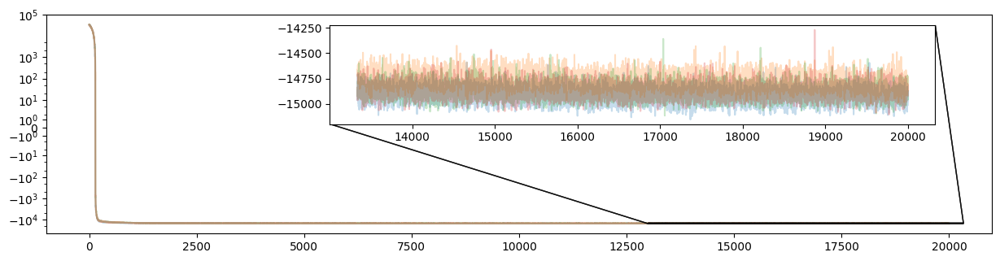

In [28]:
# Stage3: rerun pixel+PSF-correction SVI with the updated RMS map from the previous block.
# Initialization uses stage2 medians (chain-by-chain) and refines under the new noise model.

max_iterations_stage3 = max_iterations
num_chains_stage3 = num_chains

scheduler_stage3 = optax.exponential_decay(
    init_value=5e-3,
    transition_steps=200,
    decay_rate=0.99,
)
optim_stage3 = optax.adabelief(learning_rate=scheduler_stage3)
loss_stage3 = infer.TraceMeanField_ELBO()

svi_keys_stage3 = jax.random.split(jax.random.fold_in(rng_key_, 3003), num_chains_stage3)
stage3_results_list = []
stage3_guides = []

for i in range(num_chains_stage3):
    init_values_stage3_i = get_value_from_index(multi_svi_pixel_median_stage2, i)
    init_fun_stage3_i = init_to_value_or_defer(values=init_values_stage3_i)
    guide_stage3_i = autoguide.AutoDiagonalNormal(model, init_loc_fn=init_fun_stage3_i, init_scale=0.01)
    svi_stage3_i = infer.SVI(model, guide_stage3_i, optim_stage3, loss_stage3)
    result_i = svi_stage3_i.run(
        svi_keys_stage3[i],
        max_iterations_stage3,
        data,
        k_grid.k,
        conj=False,
        n_value=None,
        pixelated=True,
        provided_rms=provided_rms,
        mass_prior_kwargs=MASS_PRIOR_PIXELATED,
        psf_kernel=psf_hst,
        k_psf_values=k_psf,
        enable_psf_corr=True,
        progress_bar=True,
        stable_update=True,
    )
    stage3_guides.append(guide_stage3_i)
    stage3_results_list.append(result_i)

multi_svi_pixel_results_stage3 = jax.tree.map(_stack_or_none, *stage3_results_list)
guide_pixel_stage3 = stage3_guides[0]
multi_svi_pixel_median_stage3 = guide_pixel_stage3.median(multi_svi_pixel_results_stage3.params)
multi_svi_pixel_median_herc_stage3 = median_params2kwargs(
    lambda p, fixed_params={}: params2kwargs(p, fixed_params=fixed_params, pixelated=True),
    multi_svi_pixel_median_stage3,
    jnp.arange(num_chains_stage3),
)

_, ax = plt.subplots(figsize=(15, 3.5))
axins = ax.inset_axes([0.3, 0.5, 0.64, 0.45])
for losses in multi_svi_pixel_results_stage3.losses:
    _ = plot_loss(losses, max_iterations_stage3, ax=ax, axins=axins, alpha=0.25)

# Keep stage3 outputs as separate variables; do not overwrite stage2 variables.

# Optional stage3 diagnostic plots with corrected PSF and correction field.
stage3_psf_kernel_det, stage3_corr_field_det = get_stage2_deterministics_from_median(multi_svi_pixel_median_stage3)



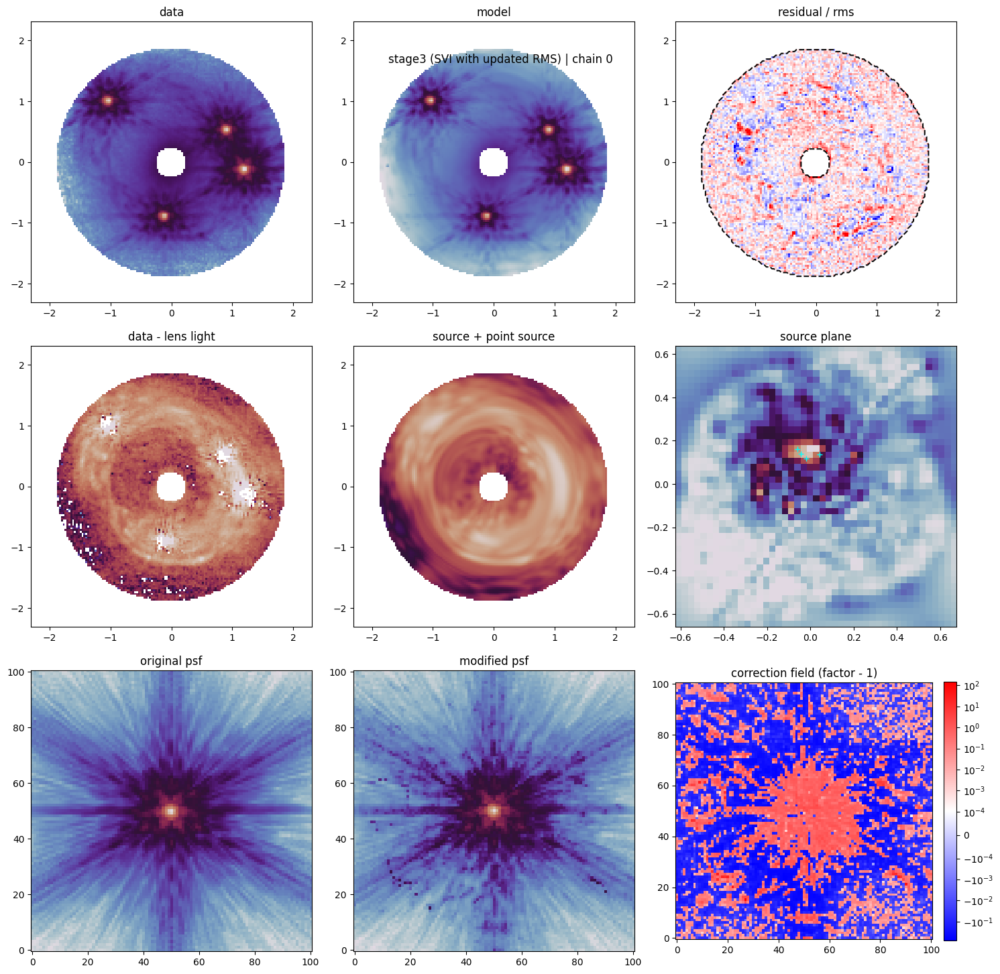

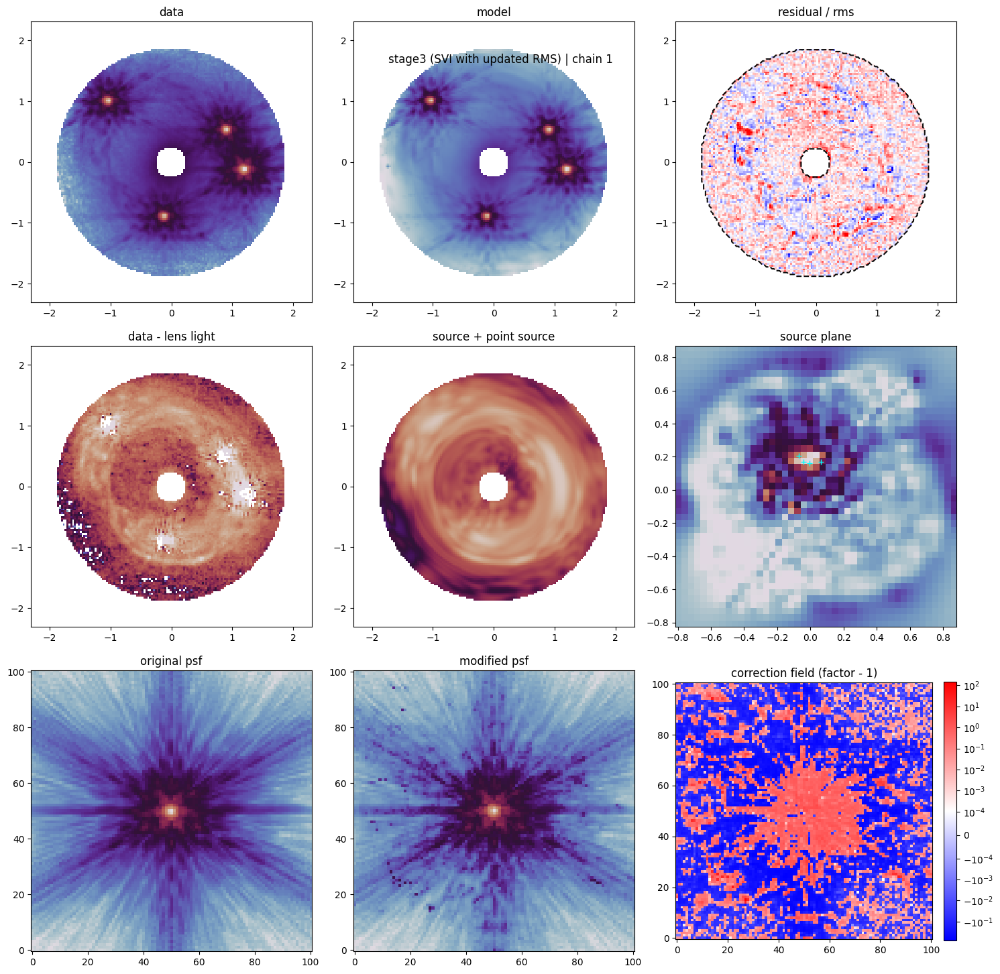

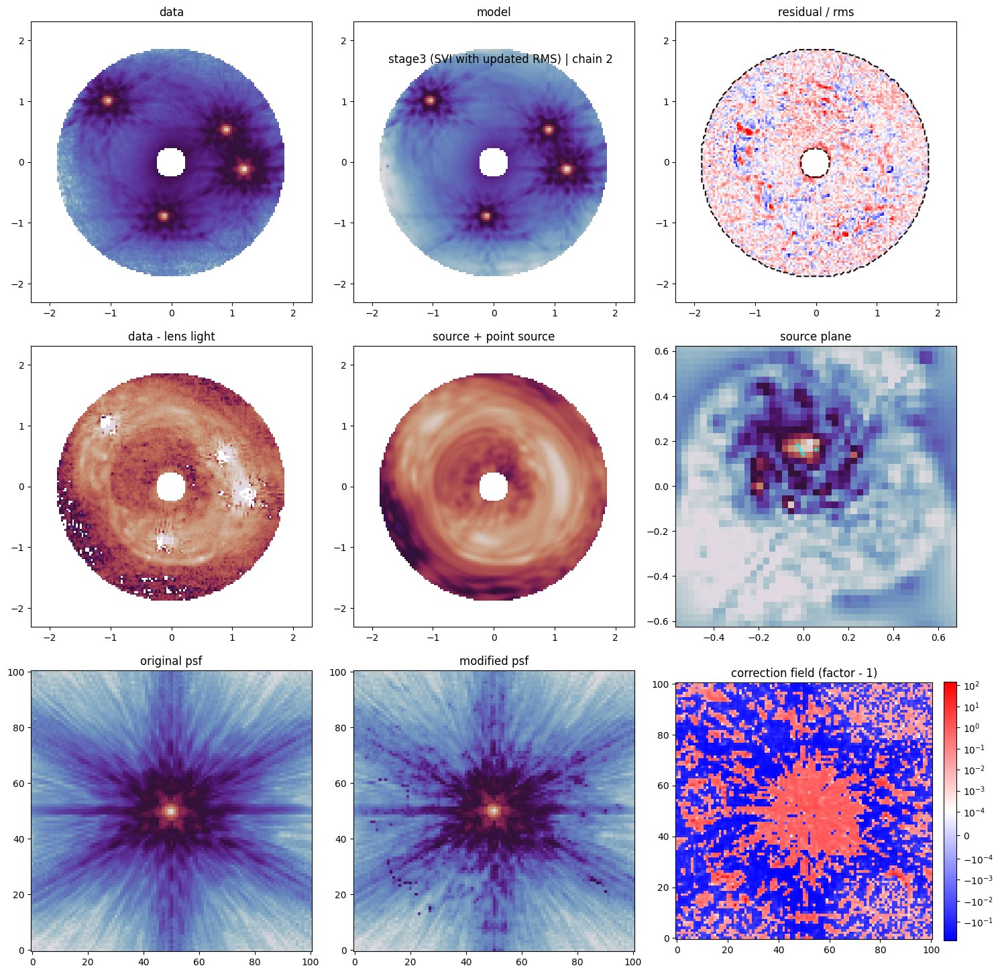

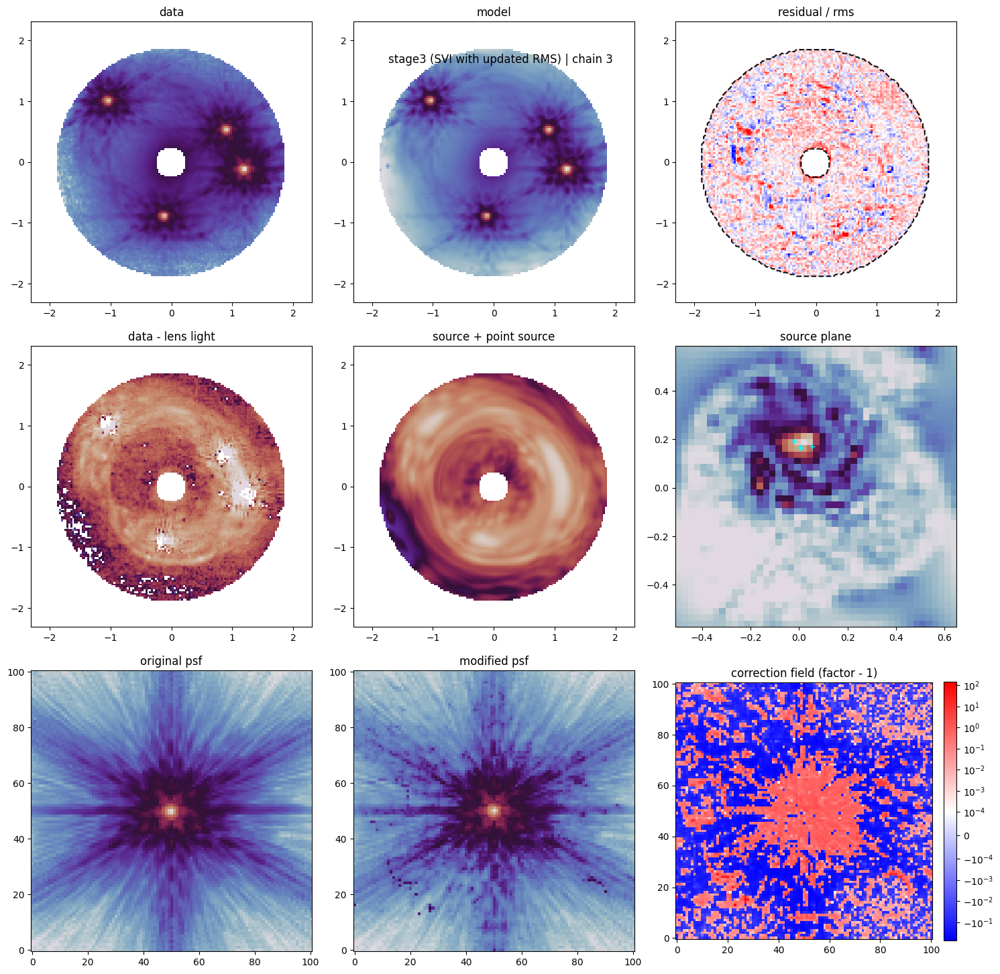

In [29]:
def plot_stage3_result_set(kwargs_all, psf_kernel_all, corr_field_all, stage_label):
    for i in range(num_chains):
        kwargs_i = get_value_from_index(kwargs_all, i)
        psf_kernel_i = get_value_from_index(psf_kernel_all, i)
        corr_field_i = get_value_from_index(corr_field_all, i)

        plt.figure(figsize=(15, 15))
        plt.suptitle(f'{stage_label} | chain {i}', y=0.92)

        plt.subplot(3, 3, 1)
        plt.imshow(np.ma.array(data, mask=~mask_out), norm='log', cmap='twilight', extent=extent, origin='lower')
        plt.title('data')

        plt.subplot(3, 3, 2)
        image_model = lens_image_pixel.model(
            **kwargs_i,
            source_add=True,
            point_source_add=True,
            psf_kernel=psf_kernel_i,
        )
        plt.imshow(np.ma.array(image_model, mask=~mask_out), norm='log', cmap='twilight', extent=extent)
        plt.title('model')

        plt.subplot(3, 3, 3)
        plt.imshow(np.ma.array((data - image_model) / rms_file, mask=~mask_out), cmap='bwr', vmax=3, vmin=-3, extent=extent)
        plt.contour(mask, levels=[0.5], colors='black', alpha=0.95, linewidth=2, linestyles='dashed', origin='lower', extent=extent)
        plt.title('residual / rms')

        lens_light_only = lens_image_pixel.model(
            **kwargs_i,
            source_add=False,
            point_source_add=True,
            psf_kernel=psf_kernel_i,
        )

        plt.subplot(3, 3, 4)
        plt.imshow(np.ma.array(data - lens_light_only, mask=~mask_out), norm='log', cmap='twilight', extent=extent, vmax = 1, vmin = 0.0001)
        plt.title('data - lens light')

        plt.subplot(3, 3, 5)
        plt.imshow(np.ma.array(image_model - lens_light_only, mask=~mask_out), norm='log', cmap='twilight', extent=extent, vmax = 1, vmin = 0.0001)
        plt.title('source + point source')

        plt.subplot(3, 3, 6)
        source, source_extent = pixelize_plane_single(
            lens_image_pixel,
            kwargs_i,
            pixel_grid_shape,
        )
        plt.imshow(source, extent=source_extent, cmap='twilight')
        src_x, src_y = trace_current_agn_to_source(lens_image_pixel, kwargs_i)
        plt.scatter(np.array(src_x), np.array(src_y), s=40, facecolors='cyan', linewidths=1.0, marker='+',zorder=10)
        # for j, (sx, sy) in enumerate(zip(np.array(src_x), np.array(src_y)), start=1):
        #     plt.text(sx + 0.01, sy + 0.01, str(j), color='cyan', fontsize=10, weight='bold')
        plt.title('source plane')

        plt.subplot(3, 3, 7)
        plt.imshow(psf_hst, origin='lower', norm='log', cmap='twilight')
        plt.title('original psf')

        plt.subplot(3, 3, 8)
        plt.imshow(psf_kernel_i, origin='lower', norm='log', cmap='twilight')
        plt.title('modified psf')

        plt.subplot(3, 3, 9)
        plt.imshow(corr_field_i - 1.0, origin='lower', cmap='bwr', norm=colors.SymLogNorm(linthresh=1e-4))
        plt.colorbar(fraction=0.046, pad=0.04)
        plt.title('correction field (factor - 1)')

        plt.tight_layout()
        plt.show()

plot_stage3_result_set(
    multi_svi_pixel_median_herc_stage3,
    stage3_psf_kernel_det,
    stage3_corr_field_det,
    'stage3 (SVI with updated RMS)',
)



### Corner plot (after third SVI)

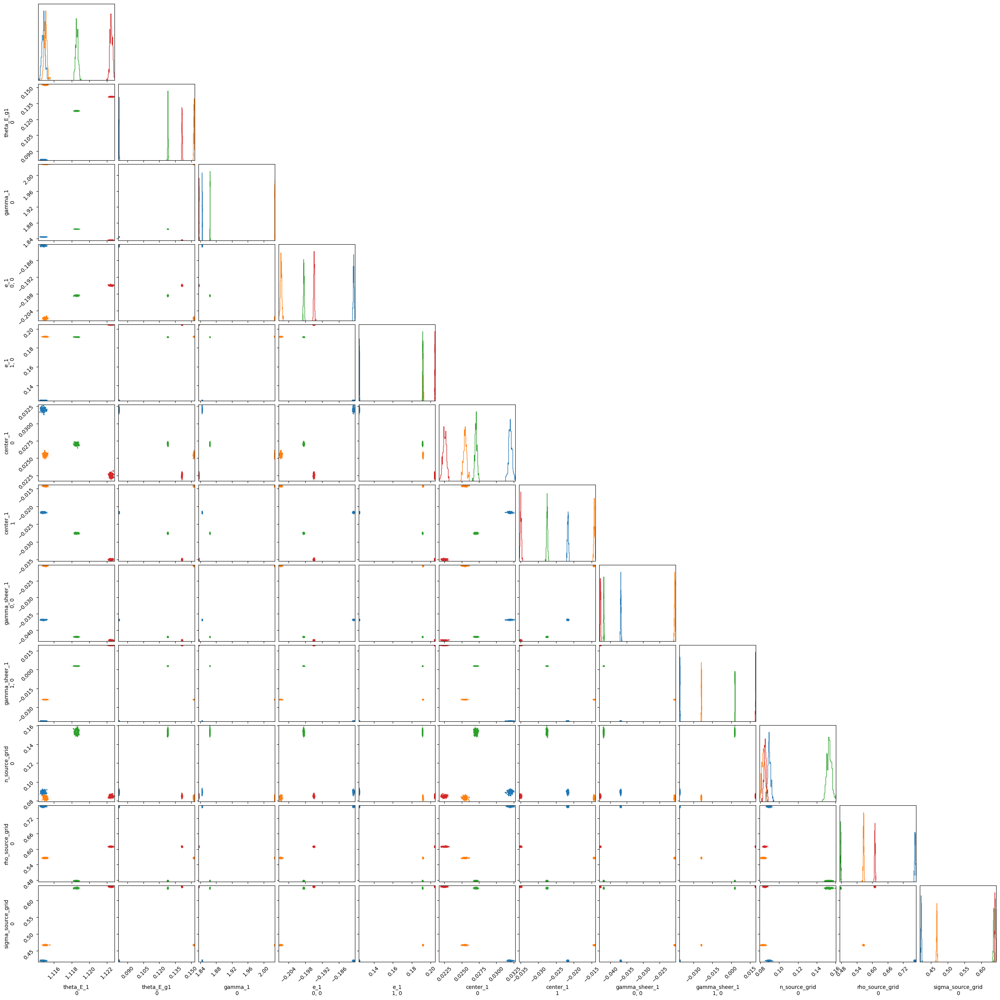

In [22]:
vars_lens_mass = ['theta_E_1', 'theta_E_g1', 'theta_E_g2', 'gamma_1', 'e_1', 'center_1', 'gamma_sheer_1']
vars_power = ['n_source_grid', 'rho_source_grid', 'sigma_source_grid']
n_corner_draws = 300  # 不要1000，先用200-400更稳

fig_corner = None
for i in range(num_chains):
    params_i = get_value_from_index(multi_svi_pixel_results_stage2.params, i)
    key_i = jax.random.fold_in(rng_key_, i)

    # 逐链采样，降低峰值内存
    samples_all_i = guide_pixel_stage2.sample_posterior(
        key_i, params_i, sample_shape=(n_corner_draws,)
    )

    # 只保留需要画corner的参数
    samples_i = {k: samples_all_i[k] for k in vars_lens_mass+vars_power}

    # 组装成 ArviZ 需要的 (chain, draw, ...)
    posterior_i = {k: jax.device_get(v)[None, ...] for k, v in samples_i.items()}
    idata_i = az.from_dict(posterior=posterior_i)

    fig_corner = corner(
        idata_i.posterior.isel(chain=0),
        var_names=vars_lens_mass+vars_power,
        color=f'C{i}',
        fig=fig_corner,
    )


In [18]:
# best_i = int(multi_svi_pixel_results.losses[:, -1000:].mean(axis=1).argmin())

# # lens_light = params2kwargs_gauss_light(get_value_from_index(multi_svi_pixel_median, best_i), 'lens', N_gauss_light, sigma_lims_lens)
# # import pickle

# # with open('lens_light_slice.pkl', 'wb') as f:
# #     pickle.dump(lens_light, f)

# # vars_fixed = vars_lens_light 
# # svi_pixel_median = get_value_from_index(multi_svi_pixel_median, best_i)
# # fixed_params_pixel = {k:svi_pixel_median[k] for k in vars_fixed}
# # model_pixel_hmc_new = condition(model, fixed_params_pixel)

## HMC of the pixel grid model

As with the SVI we can extend the HMC to the full pixel grid model.  Keeping the lens light and parameterized source light fixed at the parameterized SVI solution, and initialize the model with the pixelated SVI solution.  Given the complex 

In [34]:
vars_pixel = ['pixels_wn_source_grid']
vars_power = ['n_source_grid', 'rho_source_grid', 'sigma_source_grid']
vars_psf = ['ra_ps', 'dec_ps', 'log10_amp_ps']
vars_psf_corr = ['log_psf_corr_center']

multi_svi_pixel_median_vars = {
    k: multi_svi_pixel_median_stage2[k]
    for k in vars_mass + vars_power + vars_pixel + vars_other + vars_lens_light + vars_psf + vars_psf_corr
}

unconstrined_svi_pixel_median = jax.vmap(
    lambda p: infer.util.unconstrain_fn(
        model,
        (data, k_grid.k),
        {
            'conj': False,
            'pixelated': True,
            'provided_rms': provided_rms,
            'mass_prior_kwargs': MASS_PRIOR_PIXELATED,
            'psf_kernel': psf_hst,
            'k_psf_values': k_psf,
            'enable_psf_corr': True,
        },
        p,
    )
)(multi_svi_pixel_median_vars)

unconstrined_svi_pixel_median = {k: v.astype(jnp.float64) for k, v in unconstrined_svi_pixel_median.items()}
rng_key, rng_key_ = jax.random.split(rng_key)


In [ ]:
from numpyro.infer import NUTS, MCMC
from custom_gibbs import MultiHMCGibbs

init_fun_pixel = init_to_value_or_defer(values=get_value_from_index(multi_svi_pixel_median_stage2, 0))

inner_kernels = [
    NUTS(
        model,
        init_strategy=init_fun_pixel,
        target_accept_prob=0.95,
        max_tree_depth=10,
        dense_mass=[
            ('n_source_grid', 'rho_source_grid', 'sigma_source_grid'),
            ('A_lens', 'sigma_lens', 'e_lens', 'center_lens'),
        ],
    ),
    NUTS(
        model,
        init_strategy=init_fun_pixel,
        target_accept_prob=0.9,
        max_tree_depth=10,
        dense_mass=[('center_1',), ('theta_E_1', 'theta_E_g1', 'theta_E_g2'), ('e_1', 'gamma_1', 'gamma_sheer_1')],
    ),
    NUTS(
        model,
        init_strategy=init_fun_pixel,
        target_accept_prob=0.9,
        max_tree_depth=10,
        dense_mass=[('ra_ps', 'dec_ps', 'log10_amp_ps')],
    ),
]

outer_kernel = MultiHMCGibbs(
    inner_kernels,
    gibbs_sites_list=[
        vars_pixel + vars_power + vars_lens_light + vars_other,
        vars_mass,
        vars_psf + vars_psf_corr,
    ],
)

mcmc_pixel = MCMC(
    outer_kernel,
    num_warmup=500,
    num_samples=500,
    num_chains=num_chains,
    progress_bar=True,
    chain_method='vectorized'
)

batch_number = 1
last_states = []
batch_list = []
for i in range(batch_number):
    if i == 0:
        mcmc_pixel.run(
            rng_key_,
            data,
            k_grid.k,
            conj=False,
            pixelated=True,
            provided_rms=provided_rms,
            mass_prior_kwargs=MASS_PRIOR_PIXELATED,
            psf_kernel=psf_hst,
            k_psf_values=k_psf,
            enable_psf_corr=True,
            init_params=unconstrined_svi_pixel_median
        )
        last_states.append(jax.device_get(mcmc_pixel.last_state))
    else:
        mcmc_pixel.post_warmup_state = mcmc_pixel.last_state
        mcmc_pixel.run(
            mcmc_pixel.post_warmup_state.rng_key,
            data,
            k_grid.k,
            conj=False,
            pixelated=True,
            provided_rms=provided_rms,
            mass_prior_kwargs=MASS_PRIOR_PIXELATED,
            psf_kernel=psf_hst,
            k_psf_values=k_psf,
            enable_psf_corr=True,
        )
        last_states.append(jax.device_get(mcmc_pixel.last_state))

    mcmc_pixel._states = jax.device_get(mcmc_pixel._states)
    mcmc_pixel._states_flat = jax.device_get(mcmc_pixel._states_flat)
    mcmc_chain = az.from_numpyro(mcmc_pixel)
    mcmc_chain.to_netcdf('/mnt/lustre/tianli/quasar_hmc/WFI2033_psfcorrection'+str(i)+'.nc')
    batch_list.append(mcmc_chain)


  0%|          | 0/1000 [00:00<?, ?it/s]

In [21]:
import arviz as az
import numpy as np
batch_list = []
for i in range(1):
    current_batch = az.from_netcdf("/mnt/lustre/tianli/quasar_hmc/WFI2033_psf_correct_all.nc")
    batch_list.append(current_batch)
print('concat')  
inf_data_pixel = az.concat(*batch_list, dim='draw')
vars_mass = ['theta_E_1', 'theta_E_g1', 'theta_E_g2', 'gamma_1', 'e_1', 'center_1', 'gamma_sheer_1']
vars_lens_light = ['A_lens', 'sigma_lens', 'e_lens', 'center_lens']
vars_source_light = ['A_source', 'sigma_source', 'e_source']
vars_other = []
vars_power = ['n_source_grid', 'rho_source_grid', 'sigma_source_grid']
print(f'divergences per chain per step:\n {inf_data_pixel.sample_stats.diverging.values.sum(axis=1).T}')
#az.summary(inf_data_pixel, var_names=vars_mass + vars_power + vars_other)
az.summary(inf_data_pixel.sel(chain=np.array([0,1,2,3])), var_names=vars_mass + vars_power + vars_other)

concat
divergences per chain per step:
 [[ 237  381  126 1215]
 [   0    0    0 3471]
 [   0    0    0    0]]


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
theta_E_1[0],1.150,0.014,1.138,1.176,0.007,0.004,5.0,26.0,2.08
gamma_1[0],1.832,0.034,1.788,1.889,0.016,0.007,5.0,38.0,2.47
"e_1[0, 0]",-0.138,0.086,-0.287,-0.072,0.043,0.024,5.0,30.0,2.62
"e_1[1, 0]",0.062,0.078,-0.071,0.146,0.039,0.021,5.0,12.0,2.91
center_1[0],0.010,0.010,-0.004,0.026,0.005,0.002,5.0,22.0,2.47
center_1[1],-0.040,0.011,-0.061,-0.030,0.005,0.003,5.0,14.0,2.49
"gamma_sheer_1[0, 0]",-0.030,0.044,-0.107,-0.001,0.022,0.013,6.0,26.0,1.84
"gamma_sheer_1[1, 0]",-0.074,0.034,-0.131,-0.032,0.017,0.009,5.0,12.0,3.02
n_source_grid[0],0.007,0.006,0.000,0.017,0.000,0.000,2608.0,1248.0,1.00
rho_source_grid[0],5.717,4.922,0.395,14.543,0.711,0.087,24.0,68.0,1.11


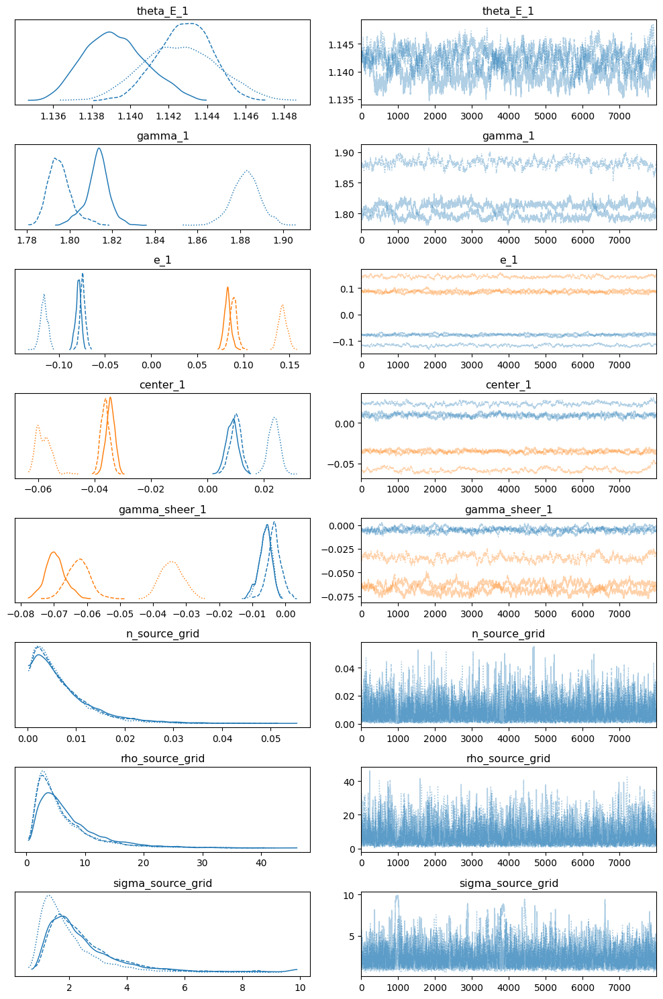

In [23]:
import matplotlib.pyplot as plt

plt.rcParams['figure.constrained_layout.use'] = True
_ = az.plot_trace(inf_data_pixel.sel(chain=np.array([0,1, 2])),var_names=vars_mass + vars_power + vars_other , figsize=(10, 15))
plt.tight_layout()

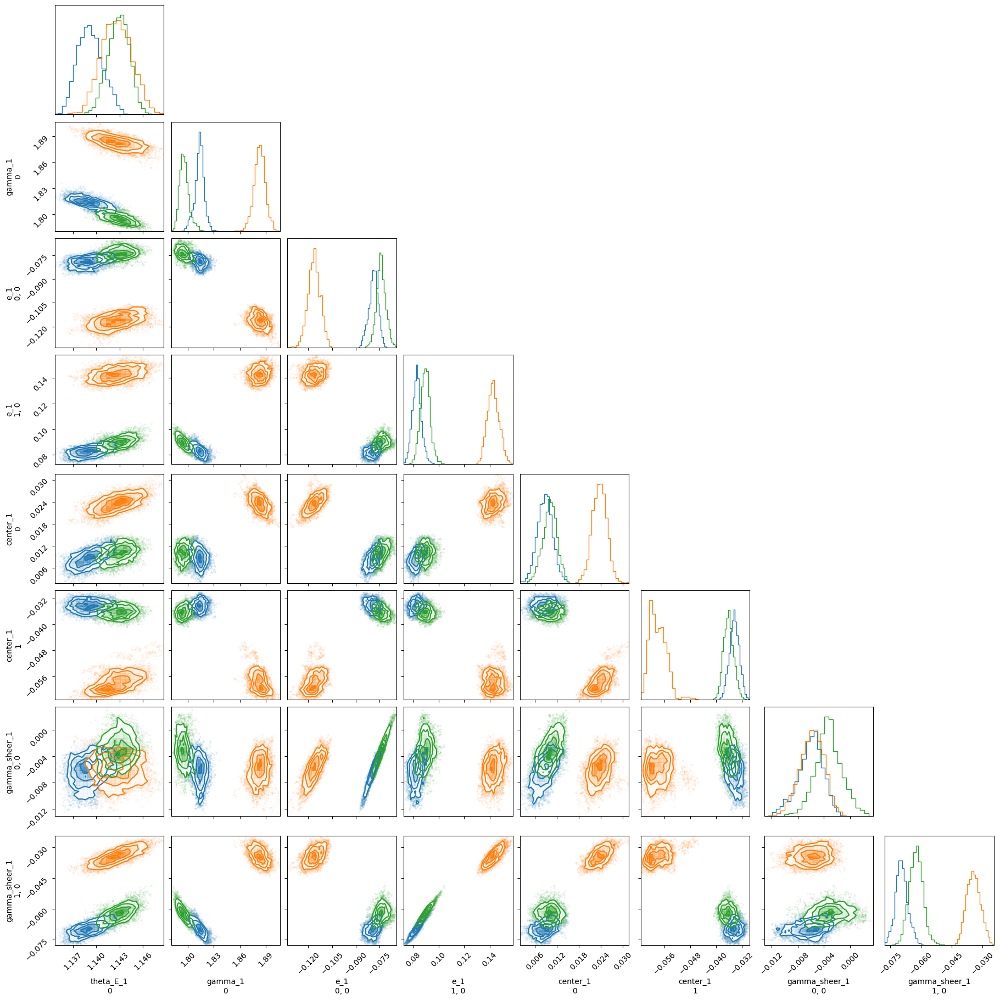

In [26]:
import corner.corner as corner
fig_corner = None
for i in range(4):
    if i!= 3:
        fig_corner = corner(
            inf_data_pixel.posterior.isel(chain=i),
            var_names=vars_mass,
            color=f'C{i}',
            fig=fig_corner,
        )

In [2]:
%load_ext autoreload
%autoreload 2
import sys
import os
import warnings
warnings.simplefilter("ignore")
# parentdir = os.path.abspath('../..')
# sys.path.insert(0, parentdir) 
from herculens_import_main import *
import jax
import numpyro
jax.config.update('jax_enable_x64', True)
numpyro.enable_x64()

pix_scale = 0.0307  # arcsec / pixel (JWST)

DATA_DIR = "../../Data/WFI2033"
raw_data_path = os.path.join(DATA_DIR, "jw01198-o004_t004_nircam_clear-f115w_i2d.fits")
data_path = os.path.join(DATA_DIR, "jw01198-o004_t004_nircam_clear-f115w_i2d_cut_x6985_y3594_150.fits")
mask_path = os.path.join(DATA_DIR, "mask.fits")
# mask_out is set to all True by design (full image likelihood region)
with fits.open(raw_data_path, memmap=True) as hdul_raw:
    exposure_time = float(hdul_raw[0].header.get("EXPTIME", hdul_raw[0].header.get("TEXPTIME", 1.0)))

with fits.open(data_path, memmap=True) as hdul:
    data = jnp.array(hdul["SCI"].data) if "SCI" in hdul else jnp.array(hdul[0].data)
    rms_file = jnp.array(hdul["ERR"].data)

mask = jnp.array(fits.getdata(mask_path), dtype=bool)
mask_out = jnp.ones_like(data, dtype=bool)
mask =  jnp.array(mask_out, dtype=bool)

corner_pixel = 10
bkg_corner = np.array(data[:corner_pixel, :corner_pixel])
bkg_mean = float(np.nanmean(bkg_corner))
bkg_rms = float(np.nanstd(bkg_corner))

data = data - bkg_mean

[CudaDevice(id=0)]


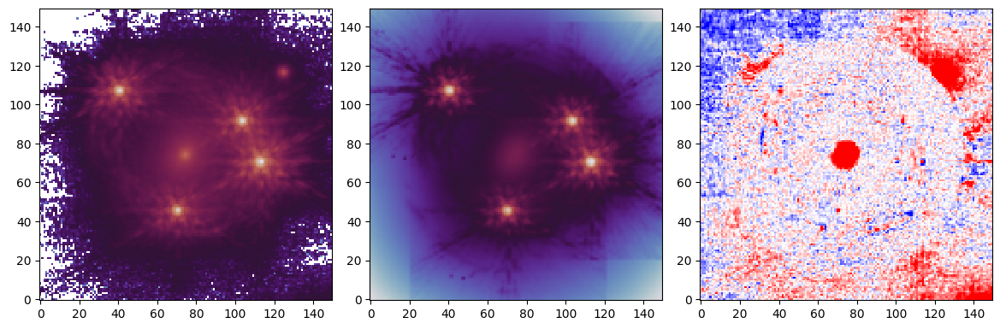

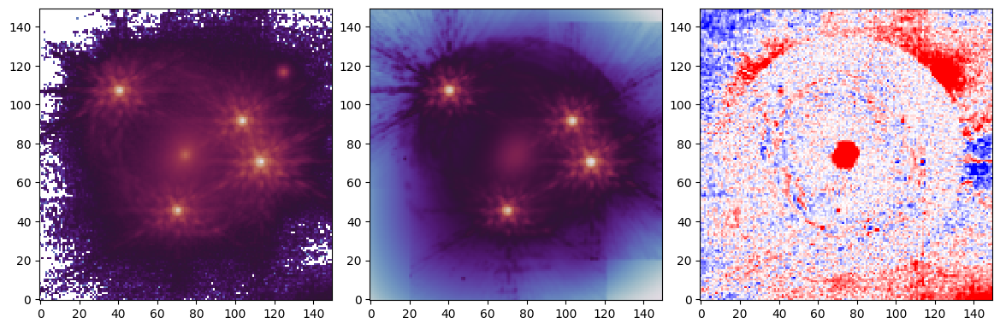

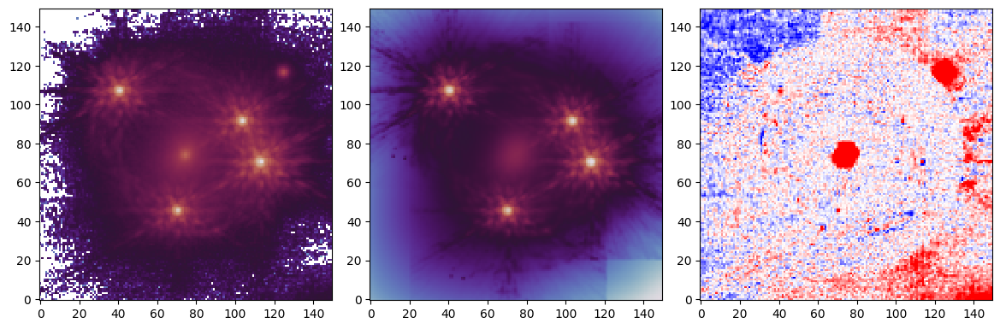

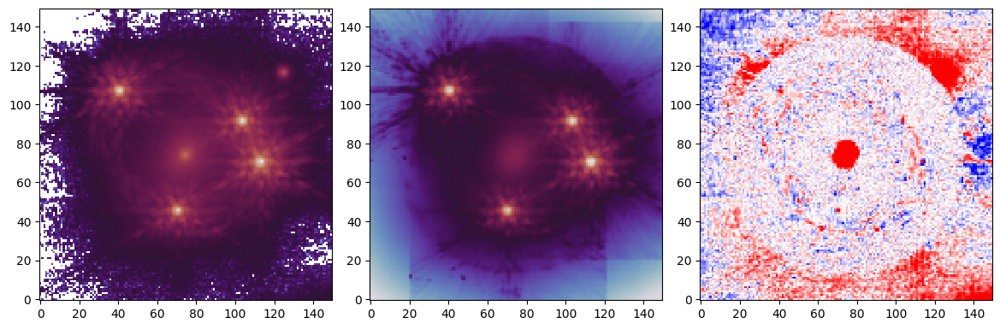

In [28]:
rms_file = jnp.array(fits.getdata('./psf_data/WFI2033_ERR_with_stage2_psf_extra.fits'))
for i in range(4):
    plt.figure(figsize = (15,5))
    plt.subplot(1,4,1)
    plt.imshow(data, norm = 'log', cmap = 'twilight', origin = 'lower')
    plt.subplot(1,4,2)
    model_image = inf_data_pixel.posterior.model_image.median(axis = 1)[i,:,:]
    plt.imshow(model_image, norm = 'log', cmap = 'twilight', origin = 'lower')
    plt.subplot(1,4,3)
    plt.imshow((data  - model_image) / rms_file, cmap = 'bwr', vmax = 3, vmin = -3, origin = 'lower')

In [26]:
mask_out.shape

(150, 150)

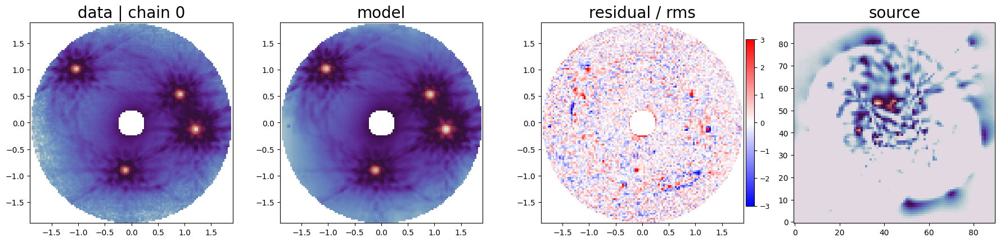

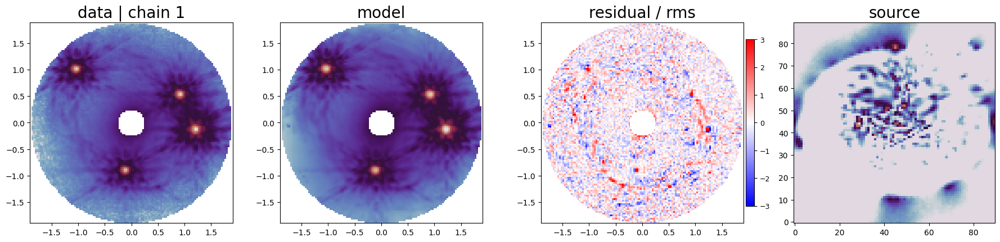

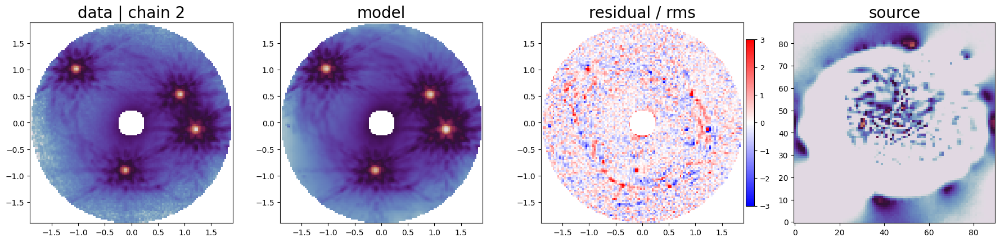

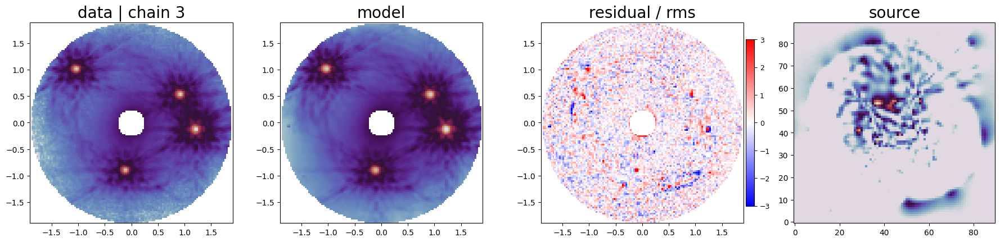

In [7]:
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import colors
from astropy.io import fits

products_dir = Path('./result/read_data/data_products')
mask_out = np.array(fits.getdata('../../Data/WFI2033/mask_out_center.fits'), dtype = bool)
data = np.array(fits.getdata(products_dir / 'data_bkg_sub.fits'), dtype=float)

pixscale = 0.031
y0, y1 = 14, 136
x0, x1 = 13, 136

Ny = y1 - y0
Nx = x1 - x0

extent = (
    (-Nx/2)*pixscale, (Nx/2)*pixscale,
    (-Ny/2)*pixscale, (Ny/2)*pixscale
)

for i in range(4):
    model_image = np.array(fits.getdata(products_dir / f'chain_{i:02d}_model.fits'), dtype=float)
    residual = np.array(fits.getdata(products_dir / f'chain_{i:02d}_residual.fits'), dtype=float)
    source = np.array(fits.getdata(products_dir / f'chain_{i:02d}_source.fits'), dtype=float)

    fig, ax = plt.subplots(
        1, 4,
        figsize=(18, 4.2),
        constrained_layout=True
    )

    # --- Data ---
    ax[0].imshow(np.ma.array(data, mask=~mask_out)[14:136, 13:136], norm='log', cmap='twilight', origin='lower', extent = extent, vmin = 0.01)
    ax[0].set_title(f'data | chain {i}', fontsize=20)

    # --- Model ---
    ax[1].imshow(np.ma.array(model_image, mask=~mask_out)[14:136, 13:136], norm='log', cmap='twilight', origin='lower', extent = extent, vmin = 0.01)
    ax[1].set_title('model', fontsize=20)

    # --- Residual ---
    im_res = ax[2].imshow(np.ma.array(residual, mask=~mask_out)[14:136, 13:136], cmap='bwr', vmin=-3, vmax=3, origin='lower', extent = extent)
    ax[2].set_title('residual / rms', fontsize=20)

    cbar = fig.colorbar(
        im_res,
        ax=ax[2],
        fraction=0.035,
        pad=0.01
    )
    cbar.ax.tick_params(labelsize=9)

    # --- Source ---
    ax[3].imshow(source, cmap='twilight', origin='lower')
    ax[3].set_title('source', fontsize=20)

    plt.savefig(f'result/lensmodel_chain:{i}.pdf')
    plt.show()